Cały projekt mocno bazuje na playing-card-detection ( https://github.com/geaxgx/playing-card-detection/blob/master/creating_playing_cards_dataset.ipynb )

Ten notatnik odpowiada za wygenerowanie scen (obrazów) z kartami w różnych pozycjach, które zostaną wykorzystane podczas trenowania sieci neuronowej.

# Wczytanie bibliotek

Zaczniemy od wczytania potrzebnych bibliotek.

In [1]:
import numpy as np
import cv2
import os
from tqdm import tqdm
import random
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import pickle
from glob import glob 
import imgaug as ia
from imgaug import augmenters as iaa
from shapely.geometry import Polygon
import shutil
import requests
import xml.etree.ElementTree as ET

# Czyszczenie

Sekcja czyszcząca folder 'data' (czyli wszystko co "produkuje" ten plik).

!!! Z tym ostrożnie !!!

In [2]:
CLEAR = False

if CLEAR:
    if os.path.exists('data'):
        shutil.rmtree('data')

# Deklaracja zmiennych i funkcji

### Wymiary kart

W pierwszej kolejności musimy zadeklarować wymiary naszych kart oraz wskazać odległości, od rogu, "łapiące" figurę i kolor karty, czyli tzw. ramkę.

Następnie wykonujemy konwersję z mm na piksele.

In [2]:
cardW = 58  # card width
cardH = 88  # card height

# top-left border coordinates
cornerXmin = 2
cornerXmax = 10.5
cornerYmin = 5.5
cornerYmax = 22.5

# We convert the measures from mm to pixels: multiply by an arbitrary factor 'zoom'
zoom = 4


cardW = int(cardW * zoom)
cardH = int(cardH * zoom)
cornerXmin = int(cornerXmin * zoom)
cornerXmax = int(cornerXmax * zoom)
cornerYmin = int(cornerYmin * zoom)
cornerYmax = int(cornerYmax * zoom)

### Funkcje wykorzystane w notebooku

* display_img - wyświetla obraz (w tym wypadku karte) wraz z boxem (ramką) łapiącym figurę i kolor karty oraz powłoką, która zawęża ten obszar

* give_me_filename - zwraca nazwy plików, które jeszcze nie istnieją, ale będą wykorzystane wkrótce (wykorzystana do generowania losowych nazw dla "wyciętych" kart)

In [3]:
def display_img(img, polygons = [], channels = 'bgr', size = 9):
    """
        Function to display an inline image, and draw optional polygons (bounding boxes, convex hulls) on it.
        Use the param 'channels' to specify the order of the channels ("bgr" for an image coming from OpenCV world)
    """
    if not isinstance(polygons,list):
        polygons = [polygons]    
    if channels == "bgr": # bgr (cv2 image)
        nb_channels = img.shape[2]
        if nb_channels == 4:
            img = cv2.cvtColor(img, cv2.COLOR_BGRA2RGBA)
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)    
    fig, ax = plt.subplots(figsize = (size,size))
    ax.set_facecolor((0,0,0))
    ax.imshow(img)
    for polygon in polygons:
        # An polygon has either shape (n,2), 
        # either (n,1,2) if it is a cv2 contour (like convex hull).
        # In the latter case, reshape in (n,2)
        if len(polygon.shape) == 3:
            polygon = polygon.reshape(-1,2)
        patch = patches.Polygon(polygon,linewidth=1, edgecolor='g', facecolor='none')
        ax.add_patch(patch)

In [4]:
def give_me_filename(dirname, suffixes, prefix = ''):
    """
        Function that returns a filename or a list of filenames in directory 'dirname'
        that does not exist yet. If 'suffixes' is a list, one filename per suffix in 'suffixes':
        filename = dirname + "/" + prefix + random number + "." + suffix
        Same random number for all the file name
        Ex: 
        > give_me_filename("dir","jpg", prefix="prefix")
        'dir/prefix408290659.jpg'
        > give_me_filename("dir",["jpg","xml"])
        ['dir/877739594.jpg', 'dir/877739594.xml']        
    """
    if not isinstance(suffixes, list):
        suffixes = [suffixes]
    
    suffixes=[p if p[0] == '.' else '.' + p for p in suffixes]
          
    while True:
        bname = "%09d"%random.randint(0,999999999)
        fnames = []
        for suffix in suffixes:
            fname = os.path.join(dirname, prefix + bname + suffix)
            if not os.path.isfile(fname):
                fnames.append(fname)
                
        if len(fnames) == len(suffixes): break
    
    if len(fnames) == 1:
        return fnames[0]
    else:
        return fnames

### Zmienne globalne

Deklarujemy zmienne globalne wykorzystane w pliku:

- data_dir - nazwa folderu, w którym składowane będą dane

- card_suits - symbole kart (s - spades, h - hearts, d - diamons, c - clubs)

- card_values - figury kart (A - ace, K - king, Q - queen, J - jack)

- backgrounds_pck_fn - paczka z tłami do generowania scen

- cards_pck_fn - paczka z obrazami kart

- imgW, imgH - wymiary generowanych obrazów

- refCard - tablica zawierająca współrzędne wymiarów karty

- refCardRot - obrócone wymiary kart

- refCornerHL, refCornerLR - współrzędne rogów wycinków na figury i kolory (odpowiednio: HL - górny lewy róg, LR - dolny prawy róg)

- refCorners - tablica łącząca refCornerHL i refCornerLR

In [6]:
data_dir = 'data'

if not os.path.isdir(data_dir):
    os.makedirs(data_dir)


card_suits = ['s','h','d','c']
card_values = ['A','K','Q','J','10','9','8','7','6','5','4','3','2']


backgrounds_pck_fn = data_dir + '/backgrounds.pck'


cards_pck_photos = data_dir + '/cards_photos.pck'
cards_pck_videos = data_dir + '/cards_videos.pck'

# imgW = 720
# imgH = 720
imgW = 1024
imgH = 1024

refCard = np.array([[0,0],[cardW,0],[cardW,cardH],[0,cardH]], dtype=np.float32)
refCardRot = np.array([[cardW,0],[cardW,cardH],[0,cardH],[0,0]], dtype=np.float32)
refCornerHL = np.array([[cornerXmin,cornerYmin],[cornerXmax,cornerYmin],[cornerXmax,cornerYmax],[cornerXmin,cornerYmax]], dtype=np.float32)
refCornerLR = np.array([[cardW-cornerXmax,cardH-cornerYmax],[cardW-cornerXmin,cardH-cornerYmax],[cardW-cornerXmin,cardH-cornerYmin],[cardW-cornerXmax,cardH-cornerYmin]], dtype=np.float32)
refCorners = np.array([refCornerHL,refCornerLR])

# Pliki tła

Teraz należy pobrać oraz spakować pliki tła (DTD - Describable Textures Dataset), które będą wykorzystywane przy generowaniu naszych scen.

1. Sprawdzamy czy plik 'data/backgrounds.pck' istnieje:
    - jeżeli tak to kończymy prace w komórce
    - jeżeli nie to kontynuujemy pracę

2. Sprawdzamy czy plik 'data/dtd-r1.0.1.tar.gz' istnieje:
    - jeżeli tak to przechodzimy do następnego kroku
    - jeżeli nie to pobieramy go z repozytorium do folderu 'data' i przechodzimy dalej

3. Rozpakowujemy plik 'data/dtd-r1.0.1.tar.gz'

4. Łączymy wypakwoane obrazy i tworzymy z nich paczkę 'data/backgrounds.pck'

5. Czyścimy wypakowany folder 'data/dtd'

In [7]:
if not os.path.exists('data/backgrounds.pck'):

    # Downloading file if not exist
    if not os.path.exists('data/dtd-r1.0.1.tar.gz'):
        fname = 'dtd-r1.0.1.tar.gz'
        url = 'https://www.robots.ox.ac.uk/~vgg/data/dtd/download/' + fname

        r = requests.get(url, stream=True)
        print('Rozpoczęto pobieranie pliku:', fname)

        total_size = int(r.headers.get('content-length'))
        with tqdm(total=total_size, unit="B", unit_scale=True, desc=f"Pobieranie pliku '{fname}'") as progress_bar:
            with open('data/' + fname, 'wb') as file:
                for data in r.iter_content(1024):
                    progress_bar.update(len(data))
                    file.write(data)

        if total_size != 0 and progress_bar.n != total_size:
            raise RuntimeError("Nie można pobrać pliku")

    # Unpacking
    print('Trwa rozpakowywanie ...')
    !tar -xf data/dtd-r1.0.1.tar.gz -C data/


    # Creating package from images
    dtd_dir="data/dtd/images/"
    bg_images=[]
    print('Trwa wczytywanie ...')
    for subdir in glob(dtd_dir+"/*"):
        for f in glob(subdir+"/*.jpg"):
            bg_images.append(mpimg.imread(f))
    print("Liczba wczytanych obrazów tła:",len(bg_images))
    
    print('Trwa zapisywanie ...')
    pickle.dump(bg_images,open(backgrounds_pck_fn,'wb'))
    print("Zapisano w:",backgrounds_pck_fn)


    # Cleaning
    shutil.rmtree('data/dtd')

Utwórzmy klasę 'Backgrounds', składającą się z wczytanych obrazów tła, która zawiera metodę 'get_random' pozwalającą nam na wybór losowego tła.

In [8]:
class Backgrounds():
    def __init__(self,backgrounds_pck_fn=backgrounds_pck_fn):
        self._images = pickle.load(open(backgrounds_pck_fn,'rb'))
        self._nb_images = len(self._images)
        print("Liczba wczytanych obrazów tła:", self._nb_images)
        
    def get_random(self, display = False):
        bg = self._images[random.randint(0,self._nb_images-1)]
        if display:
            plt.axis('off')
            plt.imshow(bg)
            
        return bg
    
backgrounds = Backgrounds()

Liczba wczytanych obrazów tła: 5640


Poniżej test wyboru losowego tła.

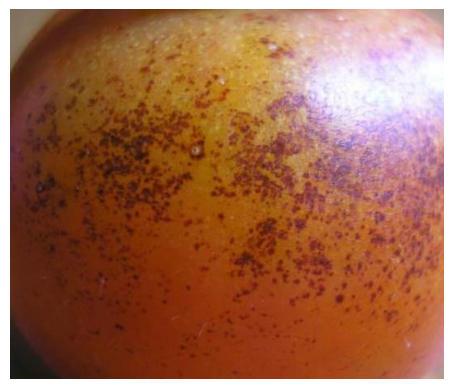

In [9]:
_=backgrounds.get_random(display=True)
# plt.imshow(backgrounds.get_random(display=True))

# Wyciąganie kart

Zacznijmy od zdefiniowania 'alphamask', które zbudowane jest z krawędzi (jak karta), ściętych rogów (symulujących zakrzywienie rogów na karcie) oraz żółtego tła. Krawędzie mają grubość 'bord_size'.

Ma ono 2 zadania:
- wyczyszczenie krawędzi karty
- uczynienie krawędzi transparentną

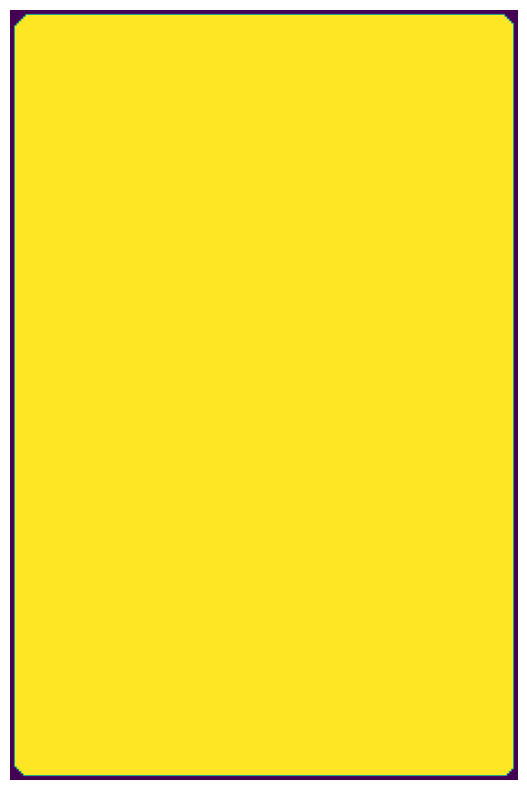

In [12]:
bord_size = 2
alphamask = np.ones((cardH,cardW), dtype=np.uint8) * 255
cv2.rectangle(alphamask,(0,0),(cardW-1,cardH-1),0,bord_size)
cv2.line(alphamask,(bord_size*3,0),(0,bord_size*3),0,bord_size)
cv2.line(alphamask,(cardW-bord_size*3,0),(cardW,bord_size*3),0,bord_size)
cv2.line(alphamask,(0,cardH-bord_size*3),(bord_size*3,cardH),0,bord_size)
cv2.line(alphamask,(cardW-bord_size*3,cardH),(cardW,cardH-bord_size*3),0,bord_size)
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(alphamask)

Zdefiniujmy sobie funkcję 'varianceOfLaplacian', która oblicza skupienie (focus) zadanego obrazu. Będzie ona przydatna za chwilę w celu sprawdzenia, czy obraz nie jest zbyt rozmazany.

In [13]:
def varianceOfLaplacian(img):
    """
    Compute the Laplacian of the image and then return the focus
    measure, which is simply the variance of the Laplacian
    Source: A.Rosebrock, https://www.pyimagesearch.com/2015/09/07/blur-detection-with-opencv/
    """
    return cv2.Laplacian(img, cv2.CV_64F).var()

Przejdźmy teraz do funkcji 'extract_card', mającej na celu wyciągnięcie grafiki karty z danego obrazu.


Działa ona w następujący sposób:
1. Obliczamy **focus** i sprawdzamy, czy nie jest mniejszy od zadanej przez nas wartości (domyślnie 120):
    - jeżeli jest mniejszy to funkcja kończy pracę i zwraca "puste wartości"
    - jeżeli jest większy to kontynuujemy pracę

2. Konwertujemy kolor obrazu do szarego, redukujemy szumy oraz wyciągamy krawędzie

3. Znajdujemy kontury na naszym obrazie i wyciągamy ten o największej powierzchni (przyjmujemy, że to jest karta)

4. Tworzymy prostokąt obejmujący nasz kontur, a następnie obliczamy pola konturu oraz prostokątu

5. Sprawdzamy stosunek pola konturu do pola kwadratu:
    - jeżeli ten stosunek jest większy od zadanej wartości (0.95 - przynajmniej 95% kwadratu jest wypełnione przez naszą kartę) to kontynuujemy pracę (**valid** = True)
    - jeżeli jest mniejszy to funkcja kończy pracę i zwraca "puste wartości" (**valid** = False)

6. Transformujemy nasz kontur do prostokąta o wymiarach **cardW** oraz **cardH** oraz determinujemy perspektywę (czy karta jest ustawiona pionowo czy poziomo)

7. Dodajemy warstwę alpha (przeźroczystść) do naszego obrazu i wykonujemy transformację opartą na perspektywie

8. Tworzymy kanał alpha, będący przeźroczysty i dopasowujemy go do konturu karty

9. Dodajemy do warstwy alpha naszą **alphamask** i do dodajemy tą warstwe do obrazu karty

10. (Opcjonalnie) Zapisujemy obraz karty do zadanego folderu

11. Zwracamy **valid** oraz obraz karty


Jeżeli *debug = True* to wyświetlą nam się dodatkowe informacje:
- focus oraz ratio (stosunek pola konturu do pola kwadratu)
- obraz w skali szarości
- obraz zawierający kontury

In [14]:
def extract_card(img, output_fn=None, min_focus=120, debug=False):
    """
    """
    imgwarp = None
    
    # Check the image is not too blurry
    focus=varianceOfLaplacian(img)
    if focus < min_focus: 
        if debug: print("Focus too low :", focus)
        return False, None
    
    # Convert in gray color
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    # Noise-reducing and edge-preserving filter
    gray = cv2.bilateralFilter(gray,11,17,17)
    
    # Edge extraction
    edge = cv2.Canny(gray,30,200)

    
    # Find the contours in the edged image
    cnts, _ = cv2.findContours(edge.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # We suppose that the contour with largest area corresponds to the contour delimiting the card
    cnt = sorted(cnts, key = cv2.contourArea, reverse = True)[0]
    
    # We want to check that 'cnt' is the contour of a rectangular shape
    # First, determine 'box', the minimum area bounding rectangle of 'cnt'
    # Then compare area of 'cnt' and area of 'box'
    # Both areas sould be very close
    rect = cv2.minAreaRect(cnt)
    box = cv2.boxPoints(rect)
    box = np.intp(box)
    areaCnt = cv2.contourArea(cnt)
    areaBox = cv2.contourArea(box)
    valid = areaCnt/areaBox > 0.95
    
    if valid:
        # We want transform the zone inside the contour into the reference rectangle of dimensions (cardW,cardH)
        ((xr,yr),(wr,hr),thetar) = rect
        # Determine 'Mp' the transformation that transforms 'box' into the reference rectangle
        if wr > hr:
            Mp = cv2.getPerspectiveTransform(np.float32(box),refCard)
        else:
            Mp = cv2.getPerspectiveTransform(np.float32(box),refCardRot)
        # Determine the warped image by applying the transformation to the image
        imgwarp = cv2.warpPerspective(img,Mp,(cardW,cardH))
        # Add alpha layer
        imgwarp = cv2.cvtColor(imgwarp,cv2.COLOR_BGR2BGRA)
        
        # Shape of 'cnt' is (n,1,2), type=int with n = number of points
        # We reshape into (1,n,2), type=float32, before feeding to perspectiveTransform
        cnta = cnt.reshape(1,-1,2).astype(np.float32)
        # Apply the transformation 'Mp' to the contour
        cntwarp = cv2.perspectiveTransform(cnta,Mp)
        cntwarp = cntwarp.astype(int)
        
        # We build the alpha channel so that we have transparency on the
        # external border of the card
        # First, initialize alpha channel fully transparent
        alphachannel = np.zeros(imgwarp.shape[:2],dtype=np.uint8)
        # Then fill in the contour to make opaque this zone of the card 
        cv2.drawContours(alphachannel,cntwarp,0,255,-1)
        
        # Apply the alphamask onto the alpha channel to clean it
        alphachannel = cv2.bitwise_and(alphachannel, alphamask)
        
        # Add the alphachannel to the warped image
        imgwarp[:,:,3] = alphachannel
        
        # Save the image to file
        if output_fn is not None:
            cv2.imwrite(output_fn,imgwarp)
        
    if debug:
        print('Focus:', focus, ' |  Ratio:', areaCnt/areaBox)
        fig, ax = plt.subplots(figsize = (9, 9))
        ax.set_facecolor((0,0,0))
        ax.imshow(gray)
        plt.axis('off')

        fig, ax = plt.subplots(figsize = (9, 9))
        ax.set_facecolor((0,0,0))
        ax.imshow(edge)
        plt.axis('off')

    return valid,imgwarp

Przeprowadźmy test na przykładowym zdjęciu (karta 2d).

Focus: 125.31401247209793  |  Ratio: 0.9844593753314488


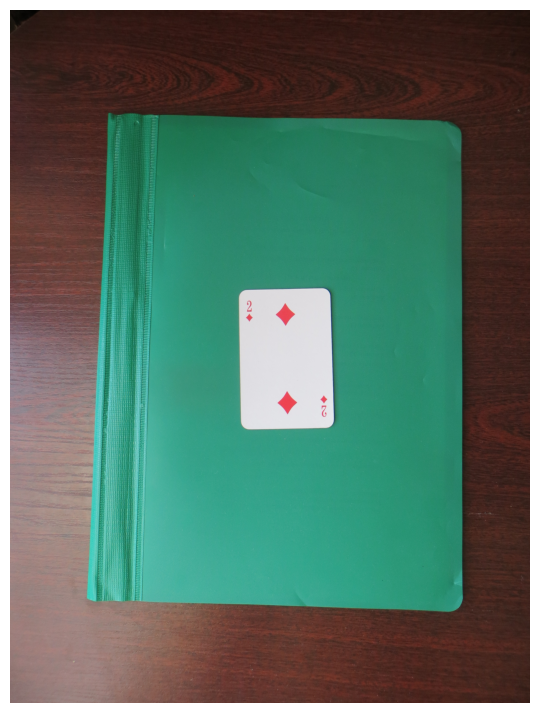

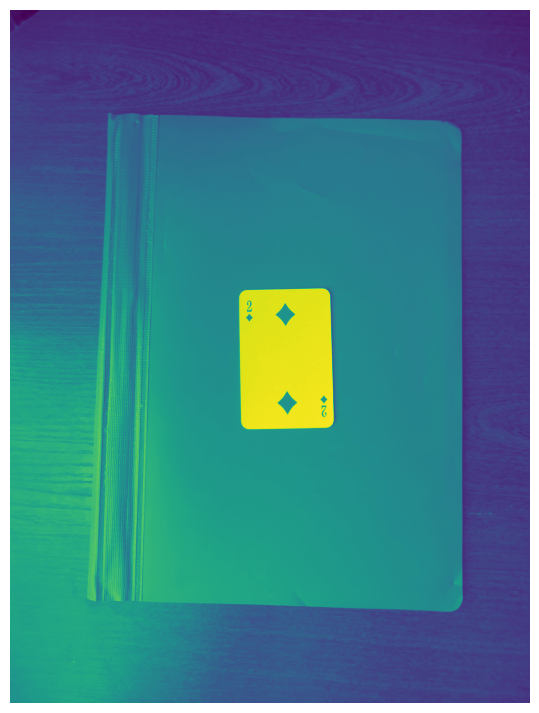

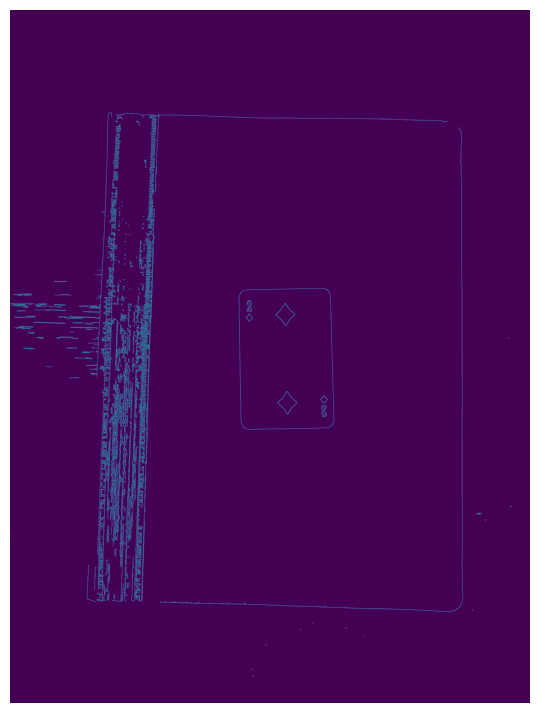

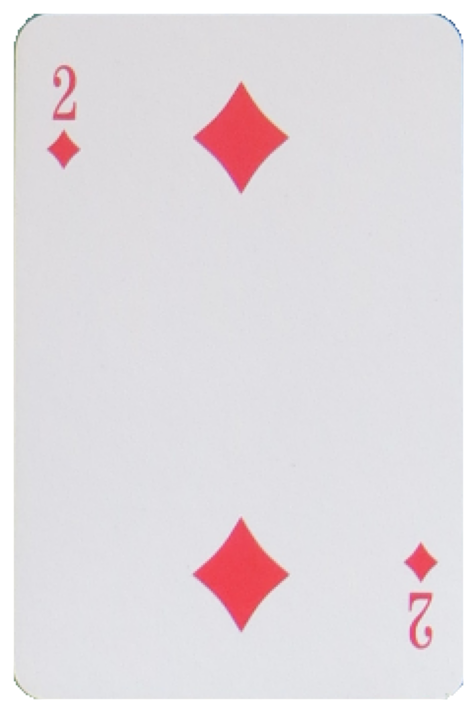

In [15]:
img=cv2.imread("files/test/two_d_3.jpg")
display_img(img)
plt.axis('off')

valid, card = extract_card(img, "files/test/extracted_card.jpg", debug = True)
if valid:
    display_img(card)
    plt.axis('off')

'test_focus_valid' to funkcja testująca focus i ratio. Pokazuje nam ona, czy zdjęcia w zadanym folderze posiadają odpowiedni focus oraz czy ich ratio jest powyżej progu.

Jest to bardzo przydatne narzędzie do sprawdzenia dużej grupy zdjęć za jednym zamachem.

Działanie:
1. Zdefiniowanie pustych list oraz licznika

2. Utworzenie pętli przechodzącej po wszystkich zdjęciach
    1. Wczytanie zdjęcia
    2. Obliczenie focusu oraz zadeklarowanie zmienej valid, zależnej od obliczonego ratio
    3. Utworzenie podlisty zawierającej nazwę zdjęcia, focus oraz ratio
    4. Sprawdzenie czy focus jest większy od zadeklarowanego minimalnego oraz czy ratio jest większe od zadanej wartości:
        - jeżeli obie te warunki są spełnione to naszą podlistę dodajemy do **valid_list**
        - w przeciwnym wypadku podlistę dodajemy do **not_valid_list**

3. Wypisanie zaakceptowanych i odrzuconych kart oraz ich parametrów z obu list **valid_list** i **not_valid_list** wraz z ich ilością

In [100]:
def test_focus_valid(folder = "files/test/testing", extension = 'jpg', min_focus = 120, min_valid_value = 0.95):
    valid_list =  []
    not_valid_list = []
    count = 0
    
    for f in glob(folder + "/*." + extension):
        count += 1
        img=cv2.imread(f)

        focus = varianceOfLaplacian(img)

        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        gray = cv2.bilateralFilter(gray,11,17,17)
        edge = cv2.Canny(gray,30,200)
        cnts, _ = cv2.findContours(edge.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnt = sorted(cnts, key = cv2.contourArea, reverse = True)[0]
        rect = cv2.minAreaRect(cnt)
        box = cv2.boxPoints(rect)
        box = np.intp(box)
        areaCnt = cv2.contourArea(cnt)
        areaBox = cv2.contourArea(box)
        valid = areaCnt/areaBox > min_valid_value

    
        f_name = str(f).replace(folder, '')[1:]

        lst = []
        lst.append(f_name)
        lst.append(int(focus))
        lst.append(round(areaCnt/areaBox, 2))


        if focus > min_focus and valid:
            valid_list.append(lst)
        else:
            not_valid_list.append(lst)


    print('Ilość sprawdzonych kart: {}\n\n'.format(count))
    
    print('Zaakceptowane karty ({}):'.format(len(valid_list)))
    if not valid_list:
        print(' == Brak ==')
    else:
        for lst in valid_list:
            print(f'   - {lst[0]:13}  |   Focus: {lst[1]:>8}   |   Area ratio: {lst[2]:>8}')


    print('\n\n\nOdrzucone karty ({}):'.format(len(not_valid_list)))
    if not not_valid_list:
        print(' == Brak ==')
    else:
        for lst in not_valid_list:
            bad_focus = lst[1]
            bad_ratio = lst[2]

            if lst[1] < min_focus:
                bad_focus = '** ' + str(lst[1])
            if lst[2] < min_valid_value:
                bad_ratio = '** ' + str(lst[2])

            print(f'   - {lst[0]:13}  |   Focus: {bad_focus:>8}   |   Area ratio: {bad_ratio:>8}')

In [101]:
test_focus_valid()
# test_focus_valid("files/photos")

Ilość sprawdzonych kart: 4


Zaakceptowane karty (4):
   - two_c.jpg      |   Focus:      246   |   Area ratio:     0.99
   - two_d.jpg      |   Focus:      207   |   Area ratio:     0.99
   - two_h.jpg      |   Focus:      316   |   Area ratio:     0.99
   - two_s.jpg      |   Focus:      343   |   Area ratio:     0.99



Odrzucone karty (0):
 == Brak ==


Poniższa funkcja 'extract_cards_from_video' jest odpowiedzialna za wyłapywanie obrazów kart z pojedyńczego pliku wideo lub ze zdjęcia.

Działanie:
1. Sprawdzamy czy zadany plik istnieje
    - jeżeli nie to funkcja kończy pracę
    - jeżeli tak to kontynuujemy

2. Tworzymy folder docelowy jeśli podano i nie istnieje

3. Ustawiamy liczbę ukończonych klatek na 0 oraz definiujemy pustą listę **imgs_list**, która będzie zawierać nasze obrazy

4. Rozpoczynamy pętle przechodzącą przez nasze wideo (w przypadku zdjęcia wykona się ona tylko raz). Pracuemy na co n-tej klatce (**keep_ratio**), ponieważ 2 następujące są raczej bardzo zbliżone<br>
    1. Odczytujemy nasz plik
    2. Generujemy losową nazwę dla obrazu przy użycu funkcji 'give_me_filename'
    3. Dokonujemy wyekstraktowania karty z obrazu (danej klatki) używając funkcji 'extract_card'
    4. Jeżeli wszystko jest z obrazem w porządku to dodajemy go do listy **imgs_list**
    5. Przechodzimy do następnej klatki

5. Zwracamy listę obrazów **imgs_list**

In [102]:
def extract_cards_from_video(video_fn, output_dir=None, keep_ratio=5, min_focus=120):
    """
        Extract cards from media file 'video_fn' 
        If 'output_dir' is specified, the cards are saved in 'output_dir'.
        One file per card with a random file name
        Because 2 consecutives frames are probably very similar, we don't use every frame of the video, 
        but only one every 'keep_ratio' frames
        
        Returns list of extracted images
    """
    if not os.path.isfile(video_fn):
        print(f"Video file {video_fn} does not exist !!!")
        return -1,[]
    if output_dir is not None and not os.path.exists(output_dir):
        os.makedirs(output_dir)
        
    cap=cv2.VideoCapture(video_fn)
    
    frame_nb=0
    imgs_list=[]
    while True:
        ret,img=cap.read()
        if not ret: break
        # Work on every 'keep_ratio' frames
        if frame_nb%keep_ratio==0:
            if output_dir is not None:
                output_fn=give_me_filename(output_dir,"jpg")
            else:
                output_fn=None
            valid,card_img = extract_card(img,output_fn,min_focus=min_focus,debug=False)
            if valid:
                imgs_list.append(card_img)
        frame_nb+=1
    
    return imgs_list

Test wyciągnięcia karty ze zdjęcia.

In [103]:
if os.path.exists('files/test/2d'):
    shutil.rmtree('files/test/2d')
    
imgs = extract_cards_from_video("files/test/two_d.jpg", output_dir="files/test/2d")
print("Liczba wyciągniętych kart:", len(imgs))

Liczba wyciągniętych kart: 1


Test wyciągnięcia karty z wideo.

In [104]:
if os.path.exists('files/test/2c'):
    shutil.rmtree('files/test/2c')
    
imgs = extract_cards_from_video("files/test/two_c.mov", output_dir="files/test/2c")
print("Liczba wyciągniętych kart:", len(imgs))

Liczba wyciągniętych kart: 71


Funkcja wyciągająca karty z wszystkich plików o podanym rozszerzeniu z zadanego folderu do podanego folderu.

Działanie:
1. Zdefiniujmy dwie listy **nums**, **num_to_word** z czego pierwsza zawiera figury będące cyframi, a druga angielskie tłumaczenie tych liczb. Robię to ponieważ funkcja nie działała poprawnie, jeżeli pliki zawierały liczbę w swojej nazwie

2. Sprawdzamy czy istnieje folder docelowy **imgs_dir**:
    - jeżeli tak to funkcja kończy pracę
    - jeżeli nie to kontynuujemy

3. Robimy pętle dla każdego koloru oraz kolejną w niej dla każdej figury
    1. Przypisujemy nazwę karty
    2. Sprawdzamy czy figura jest liczbą i na tej podstawie będziemy wyszukiwać nazwę pliku, z którego wyciągniemy karty
    3. Dla każdej karty tworzymy folder z jej nazwą, jeżeli taki nie istnieje
    4. Dokonujemy wyciągniecia kart przy użycu funkcji 'extract_cards_from_video'
    5. Wypisujemy ile kart zostało wyciągniętych

In [105]:
def extract_all_from(video_dir, imgs_dir, extension):
    nums = ['10','9','8','7','6','5','4','3','2']
    num_to_word = ['ten', 'nine', 'eight', 'seven', 'six', 'five', 'four', 'three', 'two']
    
    if not os.path.exists(imgs_dir):

        for suit in card_suits:
            for value in card_values:
                card_name = value + suit

                if value in nums:
                    video_fn = os.path.join(video_dir, num_to_word[nums.index(value)] + '_' + suit + "." + extension)
                else:
                    video_fn = os.path.join(video_dir,card_name + "." + extension)
                    
                output_dir = os.path.join(imgs_dir,card_name)
                if not os.path.isdir(output_dir):
                    os.makedirs(output_dir)

                imgs = extract_cards_from_video(video_fn, output_dir)
                print(f"Obrazy dla {card_name:3}: {len(imgs)}")
            print('\n')

### Zdjęcia

Wyciągnijmy karty z wszystkich zdjęć.

In [106]:
video_dir = "files/photos"
imgs_dir = "data/cards/photos"
extension = "jpg"

extract_all_from(video_dir, imgs_dir, extension)

Sprawdźmy losową kartę wyciągniętą ze zdjęć

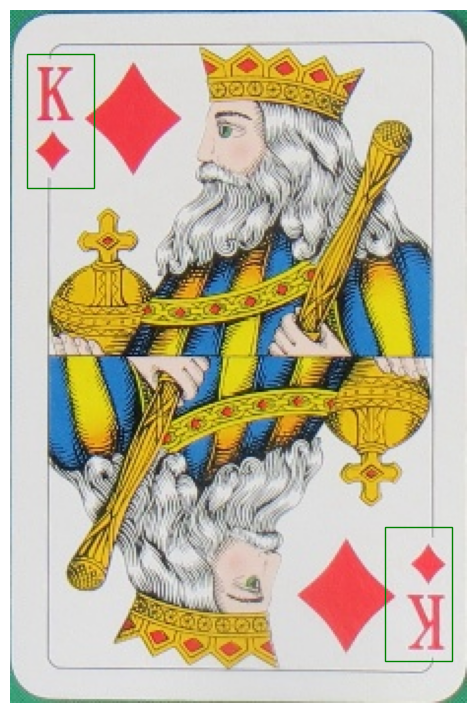

In [107]:
imgs_dir = "data/cards/photos"
imgs_fns = glob(imgs_dir + "/*/*.jpg")
img_fn = random.choice(imgs_fns)
display_img(cv2.imread(img_fn,cv2.IMREAD_UNCHANGED), polygons=[refCornerHL,refCornerLR])
plt.axis('off')

### Wideo

Wyciągnijmy karty z wszystkich plików wideo.

In [108]:
video_dir = "files/videos"
imgs_dir = "data/cards/videos"
extension = "mov"

extract_all_from(video_dir, imgs_dir, extension)

Sprawdźmy losową kartę wyciągniętą z plików wideo

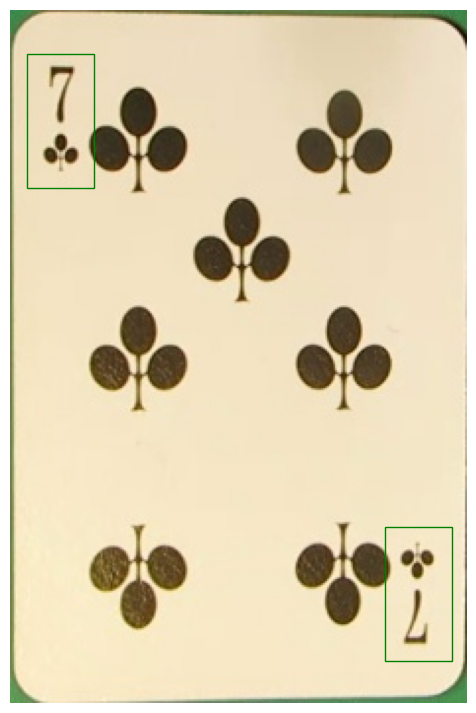

In [161]:
imgs_dir = "data/cards/videos"
imgs_fns = glob(imgs_dir + "/*/*.jpg")
img_fn = random.choice(imgs_fns)
display_img(cv2.imread(img_fn,cv2.IMREAD_UNCHANGED), polygons=[refCornerHL,refCornerLR])
plt.axis('off')

# Znajdowanie powłok

Przejdźmy teraz do funkcji znajdującej powłoki figur i symboli na naszej karcie.

Działanie:
1. Wczytujemy dane wycinków w rogach do zmiennej **corner**

2. Rozbijamy **corner** na poszczególne współrzędne: x1, y1, x2, y2 oraz obliczamy szerokość oraz wysokość

3. Tworzymy zmienną **zone** będącą podanym wycinkiem

4. Konwertujemy **zone** w skale szarości, tworzymy krawędzie oraz rozszerzamy elementy na wycinku

5. Znajdujemy kontury oraz definiujemy minumalne pole powłoki i minimalną solidność

6. Tworzymy pętle, w której dla każdego konturu:
    1. Obliczamy powierzchnię konturu
    2. Tworzymy powłokę na konturze i obliczamy jej pole
    3. Tyznaczamy moment oraz środek ciężkości konturu
    4. Sprawdzamy czy środek ciężkości konturu oraz pole i solidność się zgadzają:
        - jeżeli tak zapisujemy sobie nasz kontur łącząc go z poprzednimi w zmiennej **concat_contour**
        - w przeciwnym wypadku nie dodajemy tego konturu
        
7. Sprawdzamy czy znaleziono jakieś kontury powłok (**concat_contour**):
    - jeżeli tak to kontynuujemy
    - jeżeli nie to funkcja kończy działanie
    
8. Tworzymy powłokę dla znalezionych konturów (**concat_contour**) oraz obliczamy jej pole

9. Sprawdzamy czy pole nam odpowiada, po czym dodajemy współrzędne rogu (**corner**) do współrzędnych powłoki, żeby były one w stosunku do obrazu całej karty

10. Zwracamy naszą powłoke

In [110]:
def findHull(img, corner=refCornerHL):
    """
        Find in the zone 'corner' of image 'img' and return, the convex hull delimiting
        the value and suit symbols
        'corner' (shape (4,2)) is an array of 4 points delimiting a rectangular zone, 
        takes one of the 2 possible values : refCornerHL or refCornerLR
        debug=
    """
    
    kernel = np.ones((3,3),np.uint8)
    corner=corner.astype(int)

    # We will focus on the zone of 'img' delimited by 'corner'
    x1=int(corner[0][0])
    y1=int(corner[0][1])
    x2=int(corner[2][0])
    y2=int(corner[2][1])
    w=x2-x1
    h=y2-y1
    zone=img[y1:y2,x1:x2].copy()

    gray=cv2.cvtColor(zone,cv2.COLOR_BGR2GRAY)
    thld=cv2.Canny(gray,30,200)
    thld=cv2.dilate(thld,kernel,iterations=1)
    
    # Find the contours
    contours,_=cv2.findContours(thld.copy(),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

    # min_area=30 # We will reject contours with small area. TWEAK, 'zoom' dependant
    min_area=30
    # min_solidity=0.3 # Reject contours with a low solidity. TWEAK
    min_solidity=0.3
    
    concat_contour=None # We will aggregate in 'concat_contour' the contours that we want to keep
    
    ok=True
    for c in contours:
        area=cv2.contourArea(c)

        hull = cv2.convexHull(c)
        hull_area = cv2.contourArea(hull)
        solidity = float(area)/hull_area
        # Determine the center of gravity (cx,cy) of the contour
        M=cv2.moments(c)
        cx=int(M['m10']/M['m00'])
        cy=int(M['m01']/M['m00'])
        #  abs(w/2-cx)<w*0.3 and abs(h/2-cy)<h*0.4 : TWEAK, the idea here is to keep only the contours which are closed to the center of the zone
        if area >= min_area and abs(w/2-cx)<w*0.3 and abs(h/2-cy)<h*0.4 and solidity>min_solidity:
            if concat_contour is None:
                concat_contour=c
            else:
                concat_contour=np.concatenate((concat_contour,c))
            
    
    if concat_contour is not None:
        # At this point, we suppose that 'concat_contour' contains only the contours corresponding the value and suit symbols   
        # We can now determine the hull
        hull=cv2.convexHull(concat_contour)
        hull_area=cv2.contourArea(hull)
        # If the area of the hull is to small or too big, there may be a problem
        # min_hull_area=940 # TWEAK, deck and 'zoom' dependant
        min_hull_area=500
        # max_hull_area=2120 # TWEAK, deck and 'zoom' dependant
        max_hull_area=2000

        if hull_area < min_hull_area or hull_area > max_hull_area: 
            ok=False
        # So far, the coordinates of the hull are relative to 'zone'
        # We need the coordinates relative to the image -> 'hull_in_img' 
        hull_in_img=hull+corner[0]

    else:
        ok=False
    
    
    if ok == False:
        return None
    
    
    return hull_in_img

Test znajdowania powłok na losowej karcie ze zdjęć

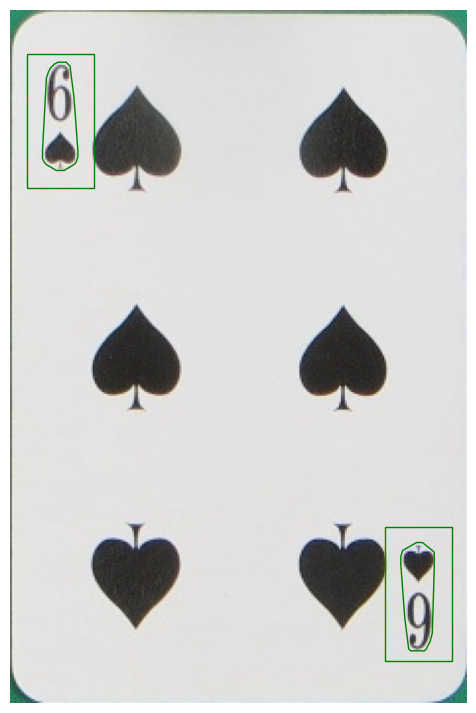

In [111]:
imgs_dir = "data/cards/photos"
imgs_fns = glob(imgs_dir+"/*/*.jpg")

img_fn = random.choice(imgs_fns)
img = cv2.imread(img_fn,cv2.IMREAD_UNCHANGED)

hullHL = findHull(img, refCornerHL)
hullLR = findHull(img, refCornerLR)
display_img(img,[refCornerHL,refCornerLR,hullHL,hullLR])

plt.axis('off')

Test znajdowania powłok na losowej karcie z wideo (pętla while jest dlatego, że czsami występują błędy w znalezieniu powłoki)

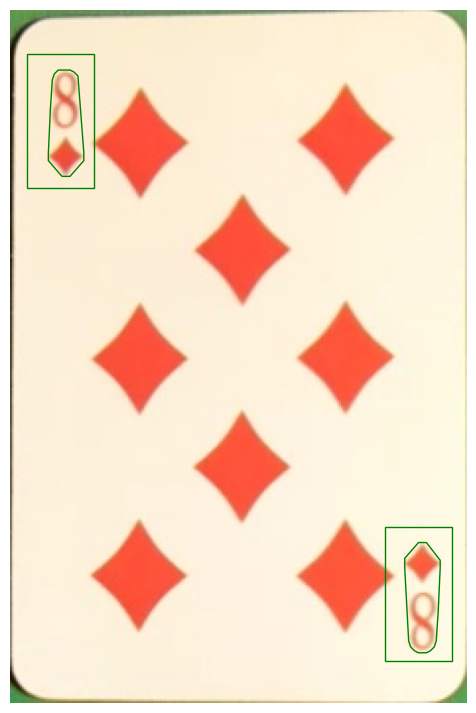

In [112]:
imgs_dir = "data/cards/videos"
imgs_fns = glob(imgs_dir+"/*/*.jpg")

while True:
    try:
        img_fn = random.choice(imgs_fns)
        img = cv2.imread(img_fn,cv2.IMREAD_UNCHANGED)

        hullHL = findHull(img, refCornerHL)
        hullLR = findHull(img, refCornerLR)
        display_img(img,[refCornerHL,refCornerLR,hullHL,hullLR])

        plt.axis('off')
        break
    except:
        pass

### Wczytanie powłok dla wszystkich kart

Funkcja 'find_all_hulls_in' odpowiada za znalezienie wszystkich powłok kart znajdujących się w zadanym folderze i pakuje je do odpowiedniego pliku.

Działanie:
1. Tworzymy pusty słownik **cards**, w którym będą znajdować się listy z powłokami dla wszystkich kart

2. Dla każdej karty:
    1. Sprawdzamy czy istnieje jej folder:
        - jeżeli tak to kontynuujemy
        - jeżeli nie to przechodzimy do następnej karty
    2. Tworzymy pustą listę wewnątrz **cards** 
    3. Dla każdego zdjęcia karty w folderze:
        1. Wczytujemy to zdjęcie
        2. Szukamy w nim obydwu powłok (znajdujących się w rogach)
        3. Jeżeli nie znajdziemy dowolnej powłoki to omijamy plik i przechodzimy do następnego
        4. Mając obydwie powłoki dodajemy je do listy danej karty w **cards**
    4. Wypisujemy liczbę obrazów poprawnie oraz błędnie wczytanych dla danej karty

3. Pakujemy **cards** w paczkę

In [113]:
def find_all_hulls_in(imgs_dir, cards_pck):
    cards={}
    count = 0
    for suit in card_suits:
        for value in card_values:
            count_errors = 0
            card_name=value+suit        
            card_dir=os.path.join(imgs_dir,card_name)
            if not os.path.isdir(card_dir):
                print(f"!!! {card_dir} nie istnieje !!!")
                continue
            cards[card_name]=[]
            for f in glob(card_dir+"/*.jpg"):
                img=cv2.imread(f,cv2.IMREAD_UNCHANGED)
                hullHL=findHull(img,refCornerHL) 
                if hullHL is None: 
                    # print(f"File {f} not used.")
                    count_errors += 1
                    continue
                hullLR=findHull(img,refCornerLR) 
                if hullLR is None: 
                    # print(f"File {f} not used.")
                    count_errors += 1
                    continue
                # We store the image in "rgb" format (we don't need opencv anymore)
                img=cv2.cvtColor(img,cv2.COLOR_BGRA2RGBA)
                cards[card_name].append((img,hullHL,hullLR))
                count += 1
            print(f"Liczba obrazów dla {card_name:3}: {len(cards[card_name]):3}   [Błędy: {count_errors:3}]")
        print('\n')



    print("\nZapisane w:",cards_pck, f'({count})')
    pickle.dump(cards,open(cards_pck,'wb'))

    cv2.destroyAllWindows()

Znalezienie powłok we wszystkich kartach ze zdjęć

In [114]:
imgs_dir="data/cards/photos"
find_all_hulls_in(imgs_dir, cards_pck_photos)

Liczba obrazów dla As :   1   [Błędy:   0]
Liczba obrazów dla Ks :   1   [Błędy:   0]
Liczba obrazów dla Qs :   1   [Błędy:   0]
Liczba obrazów dla Js :   1   [Błędy:   0]
Liczba obrazów dla 10s:   1   [Błędy:   0]
Liczba obrazów dla 9s :   1   [Błędy:   0]
Liczba obrazów dla 8s :   1   [Błędy:   0]
Liczba obrazów dla 7s :   1   [Błędy:   0]
Liczba obrazów dla 6s :   1   [Błędy:   0]
Liczba obrazów dla 5s :   1   [Błędy:   0]
Liczba obrazów dla 4s :   1   [Błędy:   0]
Liczba obrazów dla 3s :   1   [Błędy:   0]
Liczba obrazów dla 2s :   1   [Błędy:   0]


Liczba obrazów dla Ah :   1   [Błędy:   0]
Liczba obrazów dla Kh :   1   [Błędy:   0]
Liczba obrazów dla Qh :   1   [Błędy:   0]
Liczba obrazów dla Jh :   1   [Błędy:   0]
Liczba obrazów dla 10h:   1   [Błędy:   0]
Liczba obrazów dla 9h :   1   [Błędy:   0]
Liczba obrazów dla 8h :   1   [Błędy:   0]
Liczba obrazów dla 7h :   1   [Błędy:   0]
Liczba obrazów dla 6h :   1   [Błędy:   0]
Liczba obrazów dla 5h :   1   [Błędy:   0]
Liczba ob

Znalezienie powłok we wszystkich kartach z plików wideo

In [115]:
imgs_dir="data/cards/videos"
find_all_hulls_in(imgs_dir, cards_pck_videos)

Liczba obrazów dla As :  97   [Błędy:   0]
Liczba obrazów dla Ks : 132   [Błędy:   0]
Liczba obrazów dla Qs : 132   [Błędy:   0]
Liczba obrazów dla Js : 126   [Błędy:   0]
Liczba obrazów dla 10s:  77   [Błędy:   0]
Liczba obrazów dla 9s :  76   [Błędy:   0]
Liczba obrazów dla 8s :  94   [Błędy:   1]
Liczba obrazów dla 7s :  73   [Błędy:   0]
Liczba obrazów dla 6s :  72   [Błędy:   0]
Liczba obrazów dla 5s :  71   [Błędy:   0]
Liczba obrazów dla 4s :  72   [Błędy:   0]
Liczba obrazów dla 3s :  53   [Błędy:   0]
Liczba obrazów dla 2s :  50   [Błędy:   0]


Liczba obrazów dla Ah :  83   [Błędy:   0]
Liczba obrazów dla Kh : 127   [Błędy:   0]
Liczba obrazów dla Qh : 123   [Błędy:   2]
Liczba obrazów dla Jh : 122   [Błędy:   1]
Liczba obrazów dla 10h:  68   [Błędy:   0]
Liczba obrazów dla 9h :  96   [Błędy:   0]
Liczba obrazów dla 8h :  64   [Błędy:   1]
Liczba obrazów dla 7h :  63   [Błędy:   1]
Liczba obrazów dla 6h :  75   [Błędy:   1]
Liczba obrazów dla 5h :  64   [Błędy:   0]
Liczba ob

### Klasa Cards

Utwórzmy klasę 'Cards', składającą się z obrazów kart, która zawiera metodę 'get_random' pozwalającą nam na wybór losowej karty wraz z powłokami.

Utwórzmy dwa obiekty **cards_photos** oraz **cards_videos** będące klasy 'Cards'.

In [116]:
class Cards():
    def __init__(self,cards_pck_fn = cards_pck_photos):
        self._cards=pickle.load(open(cards_pck_fn,'rb'))
        # self._cards is a dictionary where keys are card names (ex:'Kc') and values are lists of (img,hullHL,hullLR) 
        self._nb_cards_by_value={k:len(self._cards[k]) for k in self._cards}
        print("Liczba kart po nazwie w pliku '{}':".format(cards_pck_fn), self._nb_cards_by_value)
        
    def get_random(self, card_name=None, display=False):
        if card_name is None:
            card_name= random.choice(list(self._cards.keys()))
        card,hull1,hull2=self._cards[card_name][random.randint(0,self._nb_cards_by_value[card_name]-1)]
        if display:
            if display: display_img(card,[hull1,hull2],"rgb")
        return card,card_name,hull1,hull2
    

cards_photos = Cards(cards_pck_photos)
print('\n')
cards_videos = Cards(cards_pck_videos)

Liczba kart po nazwie w pliku 'data/cards_photos.pck': {'As': 1, 'Ks': 1, 'Qs': 1, 'Js': 1, '10s': 1, '9s': 1, '8s': 1, '7s': 1, '6s': 1, '5s': 1, '4s': 1, '3s': 1, '2s': 1, 'Ah': 1, 'Kh': 1, 'Qh': 1, 'Jh': 1, '10h': 1, '9h': 1, '8h': 1, '7h': 1, '6h': 1, '5h': 1, '4h': 1, '3h': 1, '2h': 1, 'Ad': 1, 'Kd': 1, 'Qd': 1, 'Jd': 1, '10d': 1, '9d': 1, '8d': 1, '7d': 1, '6d': 1, '5d': 1, '4d': 1, '3d': 1, '2d': 1, 'Ac': 1, 'Kc': 1, 'Qc': 1, 'Jc': 1, '10c': 1, '9c': 1, '8c': 1, '7c': 1, '6c': 1, '5c': 1, '4c': 1, '3c': 1, '2c': 1}


Liczba kart po nazwie w pliku 'data/cards_videos.pck': {'As': 97, 'Ks': 132, 'Qs': 132, 'Js': 126, '10s': 77, '9s': 76, '8s': 94, '7s': 73, '6s': 72, '5s': 71, '4s': 72, '3s': 53, '2s': 50, 'Ah': 83, 'Kh': 127, 'Qh': 123, 'Jh': 122, '10h': 68, '9h': 96, '8h': 64, '7h': 63, '6h': 75, '5h': 64, '4h': 67, '3h': 63, '2h': 68, 'Ad': 88, 'Kd': 133, 'Qd': 116, 'Jd': 125, '10d': 73, '9d': 77, '8d': 78, '7d': 84, '6d': 61, '5d': 76, '4d': 78, '3d': 70, '2d': 57, 'Ac': 79, 'K

Wyświetlmy losową kartę wraz z jej powłoką (**cards_photos**)

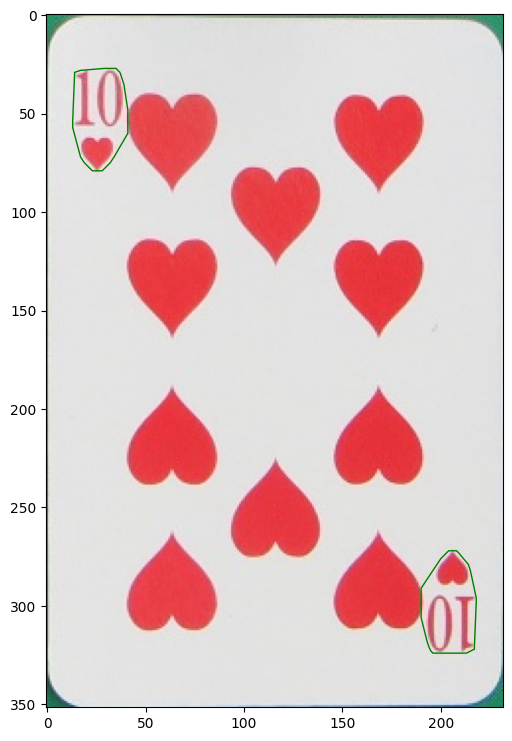

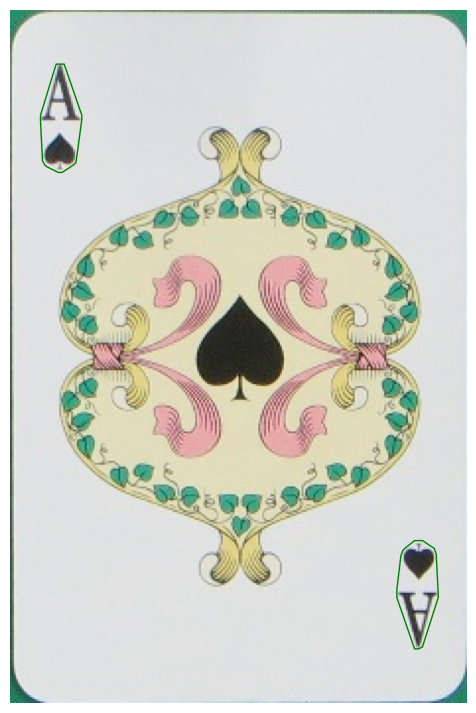

In [117]:
_=cards_photos.get_random(display=True)
# Random Ace of spades (As)
_=cards_photos.get_random("As",display=True)
plt.axis('off')

Wyświetlmy losową kartę wraz z jej powłoką (**cards_videos**)

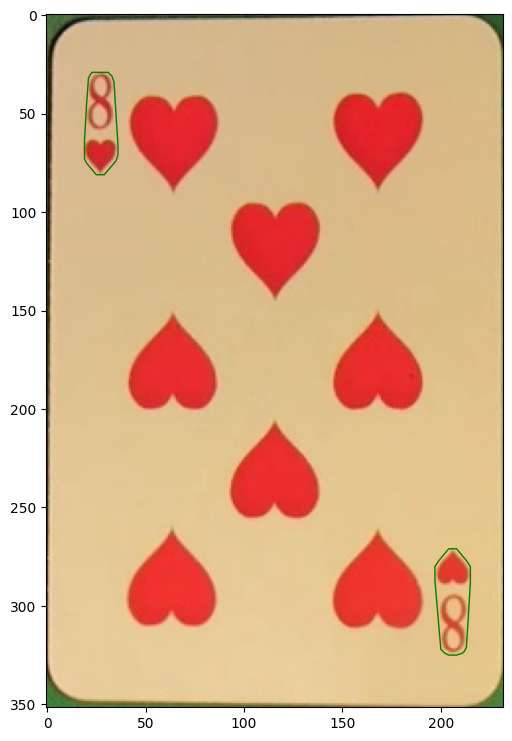

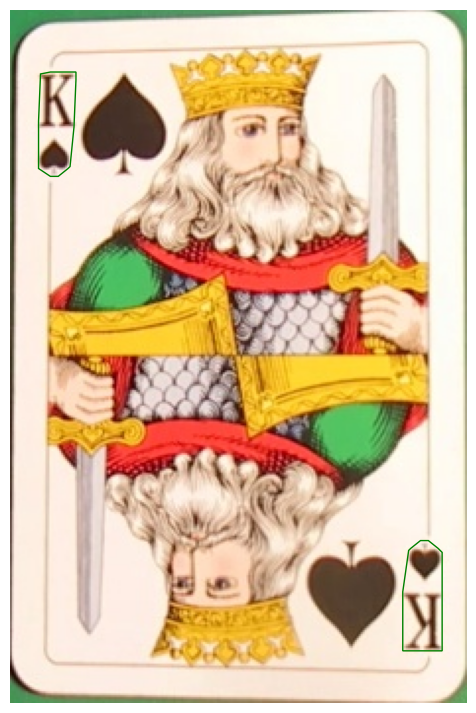

In [118]:
_=cards_videos.get_random(display=True)
# Random King of spades (Ks)
_=cards_videos.get_random("Ks",display=True)
plt.axis('off')

# Generowanie scen

Przejdźmy teraz do generowania scen, czyli naszego zbioru danych.

Rozważymy dwa rodzaje scen:
- scena z 2 kartami, całkowicie niezależnymi od siebie, na których wykonano losowe transformacje (obrót, skalowanie, itd.)
- scena z 3 kartami, będącymi zgrupowane w formie wachlarza oraz całościowo przetransformowane

Funkcja 'create_voc_xml' odpowiada za zapisywanie pól ograniczających figurę i symbol karty w formacie Pascal VOC ( http://host.robots.ox.ac.uk/pascal/VOC/voc2008/htmldoc/ ).

In [119]:
xml_body_1="""<annotation>
        <folder>FOLDER</folder>
        <filename>{FILENAME}</filename>
        <path>{PATH}</path>
        <source>
                <database>Unknown</database>
        </source>
        <size>
                <width>{WIDTH}</width>
                <height>{HEIGHT}</height>
                <depth>3</depth>
        </size>
"""
xml_object=""" <object>
                <name>{CLASS}</name>
                <pose>Unspecified</pose>
                <truncated>0</truncated>
                <difficult>0</difficult>
                <bndbox>
                        <xmin>{XMIN}</xmin>
                        <ymin>{YMIN}</ymin>
                        <xmax>{XMAX}</xmax>
                        <ymax>{YMAX}</ymax>
                </bndbox>
        </object>
"""
xml_body_2="""</annotation>        
"""

def create_voc_xml(xml_file, img_file,listbba,display=False):
    with open(xml_file,"w") as f:
        f.write(xml_body_1.format(**{'FILENAME':os.path.basename(img_file), 'PATH':img_file,'WIDTH':imgW,'HEIGHT':imgH}))
        for bba in listbba:            
            f.write(xml_object.format(**{'CLASS':bba.classname,'XMIN':bba.x1,'YMIN':bba.y1,'XMAX':bba.x2,'YMAX':bba.y2}))
        f.write(xml_body_2)
        if display: print("New xml",xml_file)

## Generator

Mając funkcję umożliwiającą nam konwersję, możemy przejść do budowania generatora scen. Wcześniej jednak musimy zdefiniować kilka owych zmiennych, funkcji oraz transformacji.

#### Zmienne

Definiujemy zmienne w zależności od ilości kart w scenariuszu:
- Dla dwóch i czterech kart mamy zmienne **decalX** oraz **decalY**, dające nam współrzędne środka oryginalnego obrazu
- W przypadku scenariusza z trzema lub sześcioma kartami wartości **decalX3**, **decalY3** są inne niż te powyżej. **decalX3** jest środkiem szerkości obrazu, a **decalY3** jest środkiem wysokości obrazu bez wysokości karty

In [120]:
# Scenario with 2 cards:
    # The original image of a card has the shape (cardH,cardW,4)
    # We first paste it in a zero image of shape (imgH,imgW,4) at position decalX, decalY
    # so that the original image is centerd in the zero image
decalX=int((imgW-cardW)/2)
decalY=int((imgH-cardH)/2)

# Scenario with 3 cards : decal values are different
decalX3=int(imgW/2)
decalY3=int(imgH/2-cardH)

#### Funkcje

- 'kps_to_polygon' - konwertuje punkty kluczowe z biblioteki *imgaug* na wielokąty z biblioteki *shaply*
- 'hull_to_kps' - konwertuje powłoki na punkty kluczowe z biblioteki *imgaug*
- 'kps_to_BB' - wyznacza ramki biblioteki *imgaug* z punktów kluczowych

In [121]:
def kps_to_polygon(kps):
    """
        Convert imgaug keypoints to shapely polygon
    """
    pts=[(kp.x,kp.y) for kp in kps]
    return Polygon(pts)

def hull_to_kps(hull, decalX=decalX, decalY=decalY):
    """
        Convert hull to imgaug keypoints
    """
    # hull is a cv2.Contour, shape : Nx1x2
    kps=[ia.Keypoint(x=p[0]+decalX,y=p[1]+decalY) for p in hull.reshape(-1,2)]
    kps=ia.KeypointsOnImage(kps, shape=(imgH,imgW,3))
    return kps

def kps_to_BB(kps):
    """
        Determine imgaug bounding box from imgaug keypoints
    """
    extend=3 # To make the bounding box a little bit bigger
    kpsx=[kp.x for kp in kps.keypoints]
    minx=max(0,int(min(kpsx)-extend))
    maxx=min(imgW,int(max(kpsx)+extend))
    kpsy=[kp.y for kp in kps.keypoints]
    miny=max(0,int(min(kpsy)-extend))
    maxy=min(imgH,int(max(kpsy)+extend))
    if minx==maxx or miny==maxy:
        return None
    else:
        return ia.BoundingBox(x1=minx,y1=miny,x2=maxx,y2=maxy)

#### Transformacje

**cardKP** przedstawia nasze keypoint'y na obrazie.

Transformacje na kartach:
- iaa.Affine - dokonuje następujących zmian na karcie:
    - scale - skaluje losowo obraz karty w zadanym zakresie
    - rotate - dokonuje zadanej rotacji na karcie
    - translate_percent - przesuwa kartę na obrazie tła, procentowo
    - translate_px - przesuwa kartę na obrazie tła, w pikselach

- iaa.Multiply - zmienia losowo jasność karty

- iaa.contrast.LinearContrast - zmienia kontrast karty

- iaa.GaussianBlur - nakłada efekt rozmycia na kartę


Transformacja na tle:
- iaa.Resize - zmienia rozmiar obrazu

<br/><br/>

Wyjaśnienie znaczenia poniższych transformacji:
- cardKP - nakłada punkty kluczowe na obraz

- transform_1card - dokonuje transformacji na jednej karcie (skalowanie, rotacja, przesunięcie oraz zmiana jasności, kontrastu i rozmycia)

- trans_rot1, trans_rot2 - rotacja kart w przypadku scenariusza z 3 kartami, aby uformowały one wachlarz

- transform_3cards - transformacja wykonywana na wszystkich trzech kartach (skalowanie, rotacja, przesunięcia)

- transform_1card_for3 - transformacje wykonywane indywidualnie na każdej karcie w scenariuszu z 3 kartami (zmiana jasności, kontrastu i rozmycia)

- transform_1card_little - podobnie jak *transform_1card*, ale zmiany jasności i kontrastu są o mniejsze wartości, dodatkowo brak rozmycia

- transform_1card_for3_little - tak jak *transform_1card_for3*, ale zmiany jasności i kontrastu są o mniejsze wartości, dodatkowo brak rozmycia

- transform_1card_no - transformacja bez zmiany jasności, kontrastu i rozmycia (zostawamy tylko skalowanie, rotację i przesunięcie)

- trans_rot3, trans_rot4, trans_rot5 - rotacja kart w scenariuszu z 6 kartami

- transform_6cards - transfrmacja wykonana na wszystkich kartach w scenariuszu z 6 kartami

- scaleBg - zmiana wielkości tła do zadeklarowanej wartości (720x720)

In [122]:
# imgaug keypoints of the bounding box of a whole card
cardKP = ia.KeypointsOnImage([
    ia.Keypoint(x=decalX,y=decalY),
    ia.Keypoint(x=decalX+cardW,y=decalY),   
    ia.Keypoint(x=decalX+cardW,y=decalY+cardH),
    ia.Keypoint(x=decalX,y=decalY+cardH)
    ], shape=(imgH,imgW,3))

# imgaug transformation for one card in scenario with 2 cards
transform_1card = iaa.Sequential([
    iaa.Affine(scale=[0.75,1.2]),
    iaa.Affine(rotate=(-180,180)),
    iaa.Affine(translate_percent={"x":(-0.25,0.25),"y":(-0.25,0.25)}),
    iaa.Multiply((0.7, 1.3), per_channel=True),  # Randomly change brightness
    iaa.LinearContrast((1, 1), per_channel=True), # Randomly change contrast
    iaa.GaussianBlur(sigma=(0.0, 0.2)), # Little blur
])

# For the 3 cards scenario, we use 3 imgaug transforms, the first 2 are for individual cards, 
# and the third one for the group of 3 cards
trans_rot1 = iaa.Sequential([
    iaa.Affine(translate_px={"x": (10, 20)}),
    iaa.Affine(rotate=(22,30))
])
trans_rot2 = iaa.Sequential([
    iaa.Affine(translate_px={"x": (0, 5)}),
    iaa.Affine(rotate=(10,15))
])
transform_3cards = iaa.Sequential([
    iaa.Affine(translate_px={"x":decalX-decalX3,"y":decalY-decalY3}),
    iaa.Affine(scale=[0.75,1.1]),
    iaa.Affine(rotate=(-180,180)),
    iaa.Affine(translate_percent={"x":(-0.2,0.2),"y":(-0.2,0.2)}),
])
transform_1card_for3 = iaa.Sequential([
    iaa.Multiply((0.7, 1.3), per_channel=True),  # Randomly change brightness
    iaa.LinearContrast((1, 1), per_channel=True), # Randomly change contrast
    iaa.GaussianBlur(sigma=(0.0, 0.2)), # Little blur
])

# little transformation (Lower iaa.Multiply, no blur)
transform_1card_little = iaa.Sequential([
    iaa.Affine(scale=[0.75,1.2]),
    iaa.Affine(rotate=(-180,180)),
    iaa.Affine(translate_percent={"x":(-0.25,0.25),"y":(-0.25,0.25)}),
    iaa.Multiply((0.85, 1.15), per_channel=True),  # Randomly change brightness
    iaa.LinearContrast((1, 1), per_channel=True), # Randomly change contrast
])
transform_1card_for3_little = iaa.Sequential([
    iaa.Multiply((0.85, 1.15), per_channel=True),  # Randomly change brightness
    iaa.LinearContrast((1, 1), per_channel=True), # Randomly change contrast
])

# no transformation
transform_1card_no = iaa.Sequential([
    iaa.Affine(scale=[0.75,1.1]),
    iaa.Affine(rotate=(-180,180)),
    iaa.Affine(translate_percent={"x":(-0.25,0.25),"y":(-0.25,0.25)}),
])

# 6 cards scene transformations
trans_rot3 = iaa.Sequential([
    iaa.Affine(translate_px={"x": (25, 30)}),
    iaa.Affine(rotate=(34,40))
])
trans_rot4 = iaa.Sequential([
    iaa.Affine(translate_px={"x": (35, 45)}),
    iaa.Affine(rotate=(46,52))
])
trans_rot5 = iaa.Sequential([
    iaa.Affine(translate_px={"x": (-180, -170), "y": (160, 170)}),
    iaa.Affine(rotate=(120,130))
])
transform_6cards = iaa.Sequential([
    iaa.Affine(translate_px={"x":decalX-decalX3,"y":decalY-decalY3}),
    iaa.Affine(scale=[0.75,1.1]),
    iaa.Affine(rotate=(-180,180)),
    iaa.Affine(translate_percent={"x":(-0.2,0.2),"y":(-0.2,0.2)}),
])


# imgaug transformation for the background
scaleBg = iaa.Resize({"height": imgH, "width": imgW})

#### Funkcja 'augment'

Odpowiada za nakładanie transformacji na karty.

In [123]:
def augment(img, list_kps, seq, restart=True):
    """
        Apply augmentation 'seq' to image 'img' and keypoints 'list_kps'
        If restart is False, the augmentation has been made deterministic outside the function (used for 3 cards scenario)
    """ 
    # Make sequence deterministic
    while True:
        if restart:
            myseq=seq.to_deterministic()
        else:
            myseq=seq
        # Augment image, keypoints and bbs 
        img_aug = myseq.augment_images([img])[0]
        list_kps_aug = [myseq.augment_keypoints([kp])[0] for kp in list_kps]
        list_bbs = [kps_to_BB(list_kps_aug[1]),kps_to_BB(list_kps_aug[2])]
        valid=True
        # Check the card bounding box stays inside the image
        for bb in list_bbs:
            if bb is None or int(round(bb.x2)) >= imgW or int(round(bb.y2)) >= imgH or int(bb.x1)<=0 or int(bb.y1)<=0:
                valid=False
                break
        if valid: break
        elif not restart:
            img_aug=None
            break
                
    return img_aug,list_kps_aug,list_bbs

#### Klasa 'BBA'

Klasa przechowująca informację o ramce oraz adnotację (nazwę karty).

In [124]:
class BBA:  # Bounding box + annotations
    def __init__(self,bb,classname):      
        self.x1=int(round(bb.x1))
        self.y1=int(round(bb.y1))
        self.x2=int(round(bb.x2))
        self.y2=int(round(bb.y2))
        self.classname=classname

### Klasa 'Scene'

Głowna klasa obrazująca scenę. W zależności od ilości wprowadzonych parametrów podczas inicjalizacji (\_\_init\_\_) wykonuję odpowiednią metodę:
- 'create2CardsScene' - scena z 2 kartami niezależnymi od siebie
- 'create3CardsScene' - scena z 3 kartami ułożonymi w wachlarz
- 'create4CardsScene' - scena z 4 kartami niezależnymi od siebie
- 'create6CardsScene' - scena z 6 kartami ułożonymi mniej więcej w wachlarz


Dodatkowe metody wewnątrz klasy to:
- 'display' - wyświetla naszą scenę
- 'res' - zwraca finalny obraz w postaci macierzy
- 'write_files' - zapisuje obraz sceny oraz tworzy plik z rozszerzeniem ".xml" przy użyciu funcji 'create_voc_xml'

<br/><br/>

Działanie metody 'create2CardsScene':
1. Konwertujemy powłoki na punkty kluczowe przy użyciu funkcji 'hull_to_kps' (są 2 karty, więc mamy 4 powłoki)

2. Losowo transformujemy pierwszą kartę (w zależności od parametru **transform_form** transformacja będzie miała inny efekt)

3. Tworzymy pętle *while*:
    1. Dokonujemy transformacji na drugim obrazie
    2. Konwertujemy punkty kluczowe drugej karty na wielokąty z użyciem funkcji 'kps_to_polygon'
    3. Dla obudwu powłok karty pierwszej:
        1. Konwertujemy jej punkty kluczowe na wielokąty ('kps_to_polygon')
        2. Obliczamy pole części wspólnej rogu karty pierwszej z kartą drugą
        3. Jeżeli to pole jest dostatecznie małe, to akceptujemy ułożenie karty drugiej
        4. W przeciwnym wypadku rozpoczynamy pętlę *while* od początku
    4. Jeżeli obie powłoki karty pierwszej są widoczne, to kończymy działanie pętli i przechodzimy dalej

4. Przypisujemy danej scenie klasyfikacje obydwu kart

5. Zapisujemy informację o ramce i nazwę kart na liście wewnątrz sceny

6. Konstruujemy finalny obraz łącząc tło z naszymi kartami
<br/><br/>

Działanie metody 'create3CardsScene':
1. Konwertujemy powłoki na punkty kluczowe przy użyciu funkcji 'hull_to_kps' (są 3 karty, więc mamy 6 powłok)

2. Dokonujemy rotacji na kartach drugiej i trzeciej

3. Każdą kartę transformujemy indywidualnie (jeżeli **transform_form** jest różne od "no"), a następnie stosujemy identyczną transformację (rotacja, skala, przesunięcie) na wszystkich kartach

4. Przypisujemy danej scenie klasyfikacje wszystkich kart

5. Zapisujemy informację o ramkach i nazwach kart na liście

6. Konstruujemy finalny obraz łącząc tło z naszymi kartami
<br/><br/>

Działanie metod 'create4CardsScene' oraz 'create6CardsScene' jest bardzo podobne do działania odpowiednio 'create2CardsScene' i 'create3CardsScene'.

In [125]:
class Scene:
    def __init__(self,bg, img1,class1,hulla1,hullb1, img2,class2,hulla2,hullb2 ,img3=None,class3=None,hulla3=None,hullb3=None, 
                 img4=None,class4=None,hulla4=None,hullb4=None ,img5=None,class5=None,hulla5=None,hullb5=None, img6=None,class6=None,hulla6=None,hullb6=None, 
                 transform_form = 'no'):
        if img6 is not None:
            self.create6CardsScene(bg, img1,class1,hulla1,hullb1, img2,class2,hulla2,hullb2, img3,class3,hulla3,hullb3, img4,class4,hulla4,hullb4, img5,class5,hulla5,hullb5, img6,class6,hulla6,hullb6, transform_form)
        elif img4 is not None:
            self.create4CardsScene(bg, img1,class1,hulla1,hullb1, img2,class2,hulla2,hullb2, img3,class3,hulla3,hullb3, img4,class4,hulla4,hullb4, transform_form)
        elif img3 is not None:
            self.create3CardsScene(bg, img1,class1,hulla1,hullb1, img2,class2,hulla2,hullb2, img3,class3,hulla3,hullb3, transform_form)
        else:
            self.create2CardsScene(bg, img1,class1, hulla1,hullb1, img2,class2,hulla2,hullb2, transform_form)
    
    def create2CardsScene(self,bg, img1,class1,hulla1,hullb1, img2,class2,hulla2,hullb2, transform_form):
        intersect_ratio=0.05

        kpsa1=hull_to_kps(hulla1)
        kpsb1=hull_to_kps(hullb1)
        kpsa2=hull_to_kps(hulla2)
        kpsb2=hull_to_kps(hullb2)
        
        # Randomly transform 1st card
        self.img1=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img1[decalY:decalY+cardH,decalX:decalX+cardW,:]=img1
        if transform_form == 'full':
            self.img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card)
        elif transform_form == 'little':
            self.img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card_little)
        else:
            self.img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card_no)

        # Randomly transform 2nd card. We want that card 2 does not partially cover a corner of 1 card.
        # If so, we apply a new random transform to card 2
        while True:
            self.listbba=[]
            self.img2=np.zeros((imgH,imgW,4),dtype=np.uint8)
            self.img2[decalY:decalY+cardH,decalX:decalX+cardW,:]=img2
            if transform_form == 'full':
                self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card)
            elif transform_form == 'little':
                self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card_little)
            else:
                self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card_no)

            # mainPoly2: shapely polygon of card 2
            mainPoly2=kps_to_polygon(self.lkps2[0].keypoints[0:4])
            invalid=False
            for i in range(1,3):
                # smallPoly1: shapely polygon of one of the hull of card 1
                smallPoly1=kps_to_polygon(self.lkps1[i].keypoints[:])
                a=smallPoly1.area
                # We calculate area of the intersection of card 1 corner with card 2
                intersect=mainPoly2.intersection(smallPoly1)
                ai=intersect.area
                # If intersection area is small enough, we accept card 2
                if (a-ai)/a > 1-intersect_ratio:
                    self.listbba.append(BBA(self.bbs1[i-1],class1))
                # If intersectio area is not small, but also not big enough, we want apply new transform to card 2
                elif (a-ai)/a>intersect_ratio:
                    invalid=True
                    break
                    
            if not invalid: break
            

        self.class1=class1
        self.class2=class2
        for bb in self.bbs2:
            self.listbba.append(BBA(bb,class2))
        # Construct final image of the scene by superimposing: bg, img1 and img2
        self.bg=scaleBg.augment_image(bg)
        mask1=self.img1[:,:,3]
        self.mask1=np.stack([mask1]*3,-1)
        self.final=np.where(self.mask1,self.img1[:,:,0:3],self.bg)
        mask2=self.img2[:,:,3]
        self.mask2=np.stack([mask2]*3,-1)
        self.final=np.where(self.mask2,self.img2[:,:,0:3],self.final)
        
        
        
    def create3CardsScene(self,bg, img1,class1,hulla1,hullb1, img2,class2,hulla2,hullb2, img3,class3,hulla3,hullb3, transform_form):
        
        kpsa1=hull_to_kps(hulla1,decalX3,decalY3)
        kpsb1=hull_to_kps(hullb1,decalX3,decalY3)
        kpsa2=hull_to_kps(hulla2,decalX3,decalY3)
        kpsb2=hull_to_kps(hullb2,decalX3,decalY3)
        kpsa3=hull_to_kps(hulla3,decalX3,decalY3)
        kpsb3=hull_to_kps(hullb3,decalX3,decalY3)
        self.img3=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img3[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img3
        self.img3,self.lkps3,self.bbs3=augment(self.img3,[cardKP,kpsa3,kpsb3],trans_rot1)
        self.img2=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img2[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img2
        self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],trans_rot2)
        self.img1=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img1[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img1

        while True:
            det_transform_3cards = transform_3cards.to_deterministic()

            if transform_form == 'full':
                self.img3,_,_=augment(self.img3,[cardKP,kpsa3,kpsb3],transform_1card_for3)
            elif transform_form == 'little':
                self.img3,_,_=augment(self.img3,[cardKP,kpsa3,kpsb3],transform_1card_for3_little)
            _img3,_lkps3,self.bbs3=augment(self.img3,self.lkps3,det_transform_3cards, False)
            if _img3 is None: continue

            if transform_form == 'full':
                self.img2,_,_=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card_for3)
            elif transform_form == 'little':
                self.img2,_,_=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card_for3_little)
            _img2,_lkps2,self.bbs2=augment(self.img2,self.lkps2,det_transform_3cards, False)
            if _img2 is None: continue

            if transform_form == 'full':
                self.img1,_,_=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card_for3)
            elif transform_form == 'little':
                self.img1,_,_=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card_for3_little)
            _img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],det_transform_3cards, False)
            if _img1 is None: continue

            break

        self.img3=_img3
        self.lkps3=_lkps3
        self.img2=_img2
        self.lkps2=_lkps2
        self.img1=_img1
        
        self.class1=class1
        self.class2=class2
        self.class3=class3
        self.listbba=[BBA(self.bbs1[0],class1),BBA(self.bbs2[0],class2),BBA(self.bbs3[0],class3),BBA(self.bbs3[1],class3)]
        
        # Construct final image of the scene by superimposing: bg, img1, img2 and img3
        self.bg=scaleBg.augment_image(bg)
        mask1=self.img1[:,:,3]
        self.mask1=np.stack([mask1]*3,-1)
        self.final=np.where(self.mask1,self.img1[:,:,0:3],self.bg)
        mask2=self.img2[:,:,3]
        self.mask2=np.stack([mask2]*3,-1)
        self.final=np.where(self.mask2,self.img2[:,:,0:3],self.final)
        mask3=self.img3[:,:,3]
        self.mask3=np.stack([mask3]*3,-1)
        self.final=np.where(self.mask3,self.img3[:,:,0:3],self.final)


    def create4CardsScene(self,bg, img1,class1,hulla1,hullb1, img2,class2,hulla2,hullb2, img3,class3,hulla3,hullb3, img4,class4,hulla4,hullb4, transform_form):
        intersect_ratio=0.05

        kpsa1=hull_to_kps(hulla1)
        kpsb1=hull_to_kps(hullb1)
        kpsa2=hull_to_kps(hulla2)
        kpsb2=hull_to_kps(hullb2)
        kpsa3=hull_to_kps(hulla3)
        kpsb3=hull_to_kps(hullb3)
        kpsa4=hull_to_kps(hulla4)
        kpsb4=hull_to_kps(hullb4)

        # 1
        self.img1=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img1[decalY:decalY+cardH,decalX:decalX+cardW,:]=img1

        if transform_form == 'full':
            self.img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card)
        elif transform_form == 'little':
            self.img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card_little)
        else:
            self.img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card_no)

        
        show_bba_list = [[True, True]]
        # 2
        while True:
            bba_supp2 = [[True, True] for k in range(3)]
            self.img2=np.zeros((imgH,imgW,4),dtype=np.uint8)
            self.img2[decalY:decalY+cardH,decalX:decalX+cardW,:]=img2
            if transform_form == 'full':
                self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card)
            elif transform_form == 'little':
                self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card_little)
            else:
                self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card_no)

            mainPoly2=kps_to_polygon(self.lkps2[0].keypoints[0:4])
            invalid=False
            
            for i in range(1,3):
                # smallPoly1: shapely polygon of one of the hull of card 1
                smallPoly1=kps_to_polygon(self.lkps1[i].keypoints[:])
                a=smallPoly1.area
                # We calculate area of the intersection of card 1 corner with card 2
                intersect=mainPoly2.intersection(smallPoly1)
                ai=intersect.area
                # If intersection area is small enough, we accept card 2
                if (a-ai)/a > 1-intersect_ratio:
                    pass
                # If intersectio area is not small, but also not big enough, we want apply new transform to card 2
                elif (a-ai)/a>intersect_ratio:
                    invalid=True
                    break
                else:
                    bba_supp2[0][i-1] = False
                    
            if not invalid: break

        show_bba_list.append([True, True])
        # 3
        while True:
            bba_supp3 = [[True, True] for k in range(3)]
            self.img3=np.zeros((imgH,imgW,4),dtype=np.uint8)
            self.img3[decalY:decalY+cardH,decalX:decalX+cardW,:]=img3
            if transform_form == 'full':
                self.img3,self.lkps3,self.bbs3=augment(self.img3,[cardKP,kpsa3,kpsb3],transform_1card)
            elif transform_form == 'little':
                self.img3,self.lkps3,self.bbs3=augment(self.img3,[cardKP,kpsa3,kpsb3],transform_1card_little)
            else:
                self.img3,self.lkps3,self.bbs3=augment(self.img3,[cardKP,kpsa3,kpsb3],transform_1card_no)

            mainPoly3=kps_to_polygon(self.lkps3[0].keypoints[0:4])
            invalid=False
            for i in range(1,3):
                smallPoly1=kps_to_polygon(self.lkps1[i].keypoints[:])
                a=smallPoly1.area
                intersect=mainPoly3.intersection(smallPoly1)
                ai=intersect.area
                if (a-ai)/a > 1-intersect_ratio:
                    pass
                elif (a-ai)/a>intersect_ratio:
                    invalid=True
                    break
                else:
                    bba_supp3[0][i-1] = False

                smallPoly2=kps_to_polygon(self.lkps2[i].keypoints[:])
                a=smallPoly2.area
                intersect=mainPoly3.intersection(smallPoly2)
                ai=intersect.area
                if (a-ai)/a > 1-intersect_ratio:
                    pass
                elif (a-ai)/a>intersect_ratio:
                    invalid=True
                    break
                else:
                    bba_supp3[1][i-1] = False
                
                    
            if not invalid: break

        show_bba_list.append([True, True])
        # 4
        while True:
            bba_supp4 = [[True, True] for k in range(3)]
            self.img4=np.zeros((imgH,imgW,4),dtype=np.uint8)
            self.img4[decalY:decalY+cardH,decalX:decalX+cardW,:]=img4
            if transform_form == 'full':
                self.img4,self.lkps4,self.bbs4=augment(self.img4,[cardKP,kpsa4,kpsb4],transform_1card)
            elif transform_form == 'little':
                self.img4,self.lkps4,self.bbs4=augment(self.img4,[cardKP,kpsa4,kpsb4],transform_1card_little)
            else:
                self.img4,self.lkps4,self.bbs4=augment(self.img4,[cardKP,kpsa4,kpsb4],transform_1card_no)

            mainPoly4=kps_to_polygon(self.lkps4[0].keypoints[0:4])
            invalid=False
            for i in range(1,3):
                smallPoly1=kps_to_polygon(self.lkps1[i].keypoints[:])
                a=smallPoly1.area
                intersect=mainPoly4.intersection(smallPoly1)
                ai=intersect.area
                if (a-ai)/a > 1-intersect_ratio:
                    pass
                elif (a-ai)/a>intersect_ratio:
                    invalid=True
                    break
                else:
                    bba_supp4[0][i-1] = False

                smallPoly2=kps_to_polygon(self.lkps2[i].keypoints[:])
                a=smallPoly2.area
                intersect=mainPoly4.intersection(smallPoly2)
                ai=intersect.area
                if (a-ai)/a > 1-intersect_ratio:
                    pass
                elif (a-ai)/a>intersect_ratio:
                    invalid=True
                    break
                else:
                    bba_supp4[1][i-1] = False

                smallPoly3=kps_to_polygon(self.lkps3[i].keypoints[:])
                a=smallPoly3.area
                intersect=mainPoly4.intersection(smallPoly3)
                ai=intersect.area
                if (a-ai)/a > 1-intersect_ratio:
                    pass
                elif (a-ai)/a>intersect_ratio:
                    invalid=True
                    break
                else:
                    bba_supp4[2][i-1] = False
                    
            if not invalid: break


        self.class1=class1
        self.class2=class2
        self.class3=class3
        self.class4=class4
        show_bba_list = [[all([bba_supp2[0][0], bba_supp3[0][0], bba_supp4[0][0]]), all([bba_supp2[0][1], bba_supp3[0][1], bba_supp4[0][1]])], 
                         [all([bba_supp2[1][0], bba_supp3[1][0], bba_supp4[1][0]]), all([bba_supp2[1][1], bba_supp3[1][1], bba_supp4[1][1]])], 
                         [all([bba_supp2[2][0], bba_supp3[2][0], bba_supp4[2][0]]), all([bba_supp2[2][1], bba_supp3[2][1], bba_supp4[2][1]])]]
        

        self.listbba = []

        for i, bb in enumerate(self.bbs1):
            if show_bba_list[0][i]:
                self.listbba.append(BBA(bb,class1))
        for i, bb in enumerate(self.bbs2):
            if show_bba_list[1][i]:
                self.listbba.append(BBA(bb,class2))
        for i, bb in enumerate(self.bbs3):
            if show_bba_list[2][i]:
                self.listbba.append(BBA(bb,class3))


        for bb in self.bbs4:
            self.listbba.append(BBA(bb,class4))

        # Construct final image of the scene by superimposing: bg, img1 and img2
        self.bg=scaleBg.augment_image(bg)
        mask1=self.img1[:,:,3]
        self.mask1=np.stack([mask1]*3,-1)
        self.final=np.where(self.mask1,self.img1[:,:,0:3],self.bg)
        mask2=self.img2[:,:,3]
        self.mask2=np.stack([mask2]*3,-1)
        self.final=np.where(self.mask2,self.img2[:,:,0:3],self.final)
        mask3=self.img3[:,:,3]
        self.mask3=np.stack([mask3]*3,-1)
        self.final=np.where(self.mask3,self.img3[:,:,0:3],self.final)
        mask4=self.img4[:,:,3]
        self.mask4=np.stack([mask4]*3,-1)
        self.final=np.where(self.mask4,self.img4[:,:,0:3],self.final)




    def create6CardsScene(self,bg, img1,class1,hulla1,hullb1, img2,class2,hulla2,hullb2, img3,class3,hulla3,hullb3, img4,class4,hulla4,hullb4, img5,class5,hulla5,hullb5, img6,class6,hulla6,hullb6, transform_form):

        kpsa1=hull_to_kps(hulla1,decalX3,decalY3)
        kpsb1=hull_to_kps(hullb1,decalX3,decalY3)
        kpsa2=hull_to_kps(hulla2,decalX3,decalY3)
        kpsb2=hull_to_kps(hullb2,decalX3,decalY3)
        kpsa3=hull_to_kps(hulla3,decalX3,decalY3)
        kpsb3=hull_to_kps(hullb3,decalX3,decalY3)
        kpsa4=hull_to_kps(hulla4,decalX3,decalY3)
        kpsb4=hull_to_kps(hullb4,decalX3,decalY3)
        kpsa5=hull_to_kps(hulla5,decalX3,decalY3)
        kpsb5=hull_to_kps(hullb5,decalX3,decalY3)
        kpsa6=hull_to_kps(hulla6,decalX3,decalY3)
        kpsb6=hull_to_kps(hullb6,decalX3,decalY3)

        self.img6=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img6[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img6
        self.img6,self.lkps6,self.bbs6=augment(self.img6,[cardKP,kpsa6,kpsb6],trans_rot5)
        self.img5=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img5[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img5
        self.img5,self.lkps5,self.bbs5=augment(self.img5,[cardKP,kpsa5,kpsb5],trans_rot4)
        self.img4=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img4[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img4
        self.img4,self.lkps4,self.bbs4=augment(self.img4,[cardKP,kpsa4,kpsb4],trans_rot3)
        self.img3=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img3[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img3
        self.img3,self.lkps3,self.bbs3=augment(self.img3,[cardKP,kpsa3,kpsb3],trans_rot1)
        self.img2=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img2[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img2
        self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],trans_rot2)
        self.img1=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img1[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img1


        while True:
            det_transform_6cards = transform_6cards.to_deterministic()

            if transform_form == 'full':
                self.img5,_,_=augment(self.img5,[cardKP,kpsa5,kpsb5],transform_1card_for3)
            elif transform_form == 'little':
                self.img5,_,_=augment(self.img5,[cardKP,kpsa5,kpsb5],transform_1card_for3_little)
            _img5,_lkps5,self.bbs5=augment(self.img5,self.lkps5,det_transform_6cards, False)
            if _img5 is None: continue

            if transform_form == 'full':
                self.img4,_,_=augment(self.img4,[cardKP,kpsa4,kpsb4],transform_1card_for3)
            elif transform_form == 'little':
                self.img4,_,_=augment(self.img4,[cardKP,kpsa4,kpsb4],transform_1card_for3_little)
            _img4,_lkps4,self.bbs4=augment(self.img4,self.lkps4,det_transform_6cards, False)
            if _img4 is None: continue

            if transform_form == 'full':
                self.img3,_,_=augment(self.img3,[cardKP,kpsa3,kpsb3],transform_1card_for3)
            elif transform_form == 'little':
                self.img3,_,_=augment(self.img3,[cardKP,kpsa3,kpsb3],transform_1card_for3_little)
            _img3,_lkps3,self.bbs3=augment(self.img3,self.lkps3,det_transform_6cards, False)
            if _img3 is None: continue

            if transform_form == 'full':
                self.img2,_,_=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card_for3)
            elif transform_form == 'little':
                self.img2,_,_=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card_for3_little)
            _img2,_lkps2,self.bbs2=augment(self.img2,self.lkps2,det_transform_6cards, False)
            if _img2 is None: continue

            if transform_form == 'full':
                self.img1,_,_=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card_for3)
            elif transform_form == 'little':
                self.img1,_,_=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card_for3_little)
            _img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],det_transform_6cards, False)
            if _img1 is None: continue

            if transform_form == 'full':
                self.img6,_,_=augment(self.img6,[cardKP,kpsa6,kpsb6],transform_1card_for3)
            elif transform_form == 'little':
                self.img6,_,_=augment(self.img6,[cardKP,kpsa6,kpsb6],transform_1card_for3_little)
            _img6,_lkps6,self.bbs6=augment(self.img6,self.lkps6,det_transform_6cards, False)
            if _img6 is None: continue

            break


        self.img6=_img6
        self.lkps6=_lkps6
        self.img5=_img5
        self.lkps5=_lkps5
        self.img4=_img4
        self.lkps4=_lkps4
        self.img3=_img3
        self.lkps3=_lkps3
        self.img2=_img2
        self.lkps2=_lkps2
        self.img1=_img1
        
        self.class1=class1
        self.class2=class2
        self.class3=class3
        self.class4=class4
        self.class5=class5
        self.class6=class6
        self.listbba=[BBA(self.bbs1[0],class1),BBA(self.bbs2[0],class2),BBA(self.bbs3[0],class3),BBA(self.bbs4[0],class4),BBA(self.bbs5[0],class5),BBA(self.bbs5[1],class5),BBA(self.bbs6[0],class6),BBA(self.bbs6[1],class6)]

        
        # Construct final image of the scene by superimposing: bg, img1, img2, img3, img4 and img5
        self.bg=scaleBg.augment_image(bg)
        mask1=self.img1[:,:,3]
        self.mask1=np.stack([mask1]*3,-1)
        self.final=np.where(self.mask1,self.img1[:,:,0:3],self.bg)
        mask2=self.img2[:,:,3]
        self.mask2=np.stack([mask2]*3,-1)
        self.final=np.where(self.mask2,self.img2[:,:,0:3],self.final)
        mask3=self.img3[:,:,3]
        self.mask3=np.stack([mask3]*3,-1)
        self.final=np.where(self.mask3,self.img3[:,:,0:3],self.final)
        mask4=self.img4[:,:,3]
        self.mask4=np.stack([mask4]*3,-1)
        self.final=np.where(self.mask4,self.img4[:,:,0:3],self.final)
        mask5=self.img5[:,:,3]
        self.mask5=np.stack([mask5]*3,-1)
        self.final=np.where(self.mask5,self.img5[:,:,0:3],self.final)
        mask6=self.img6[:,:,3]
        self.mask6=np.stack([mask6]*3,-1)
        self.final=np.where(self.mask6,self.img6[:,:,0:3],self.final)




    def display(self):
        fig,ax=plt.subplots(1,figsize=(8,8))
        ax.imshow(self.final)
        for bb in self.listbba:
            rect=patches.Rectangle((bb.x1,bb.y1),bb.x2-bb.x1,bb.y2-bb.y1,linewidth=1,edgecolor='b',facecolor='none')
            ax.add_patch(rect)

    def res(self):
        return self.final
    
    def write_files(self,save_dir,display=False):
        jpg_fn, xml_fn=give_me_filename(save_dir, ["jpg","xml"])
        plt.imsave(jpg_fn,self.final)
        if display: print("New image saved in",jpg_fn)
        create_voc_xml(xml_fn,jpg_fn, self.listbba,display=display)

## Testy

### cards_photos

Przeprowadźmy test generowania scen dla kart pochodzących ze zdjęć. Zostaną one dodatkowo poddane zmnianie jasności, kontrastu i rozmycia.

Test sceny z dwoma kartami

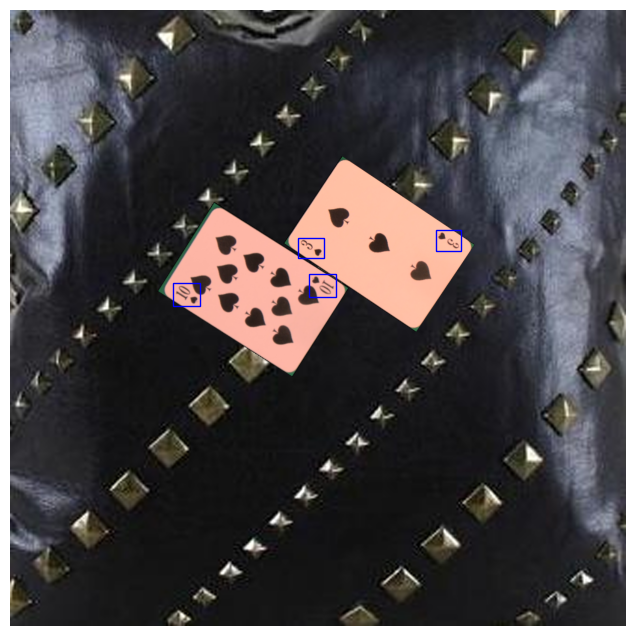

In [126]:
bg=backgrounds.get_random()
img1,card_val1,hulla1,hullb1=cards_photos.get_random()
img2,card_val2,hulla2,hullb2=cards_photos.get_random()

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2, transform_form='full')
newimg.display()
plt.axis('off')

Test sceny z trzema kartami

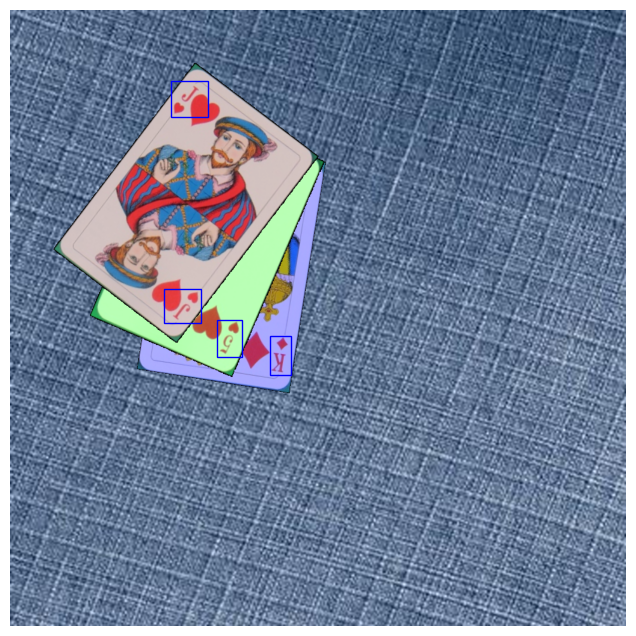

In [127]:
bg=backgrounds.get_random()
img1,card_val1,hulla1,hullb1=cards_photos.get_random()
img2,card_val2,hulla2,hullb2=cards_photos.get_random()
img3,card_val3,hulla3,hullb3=cards_photos.get_random()

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3, transform_form='full')
newimg.display()
plt.axis('off')

Test sceny z czterema kartami

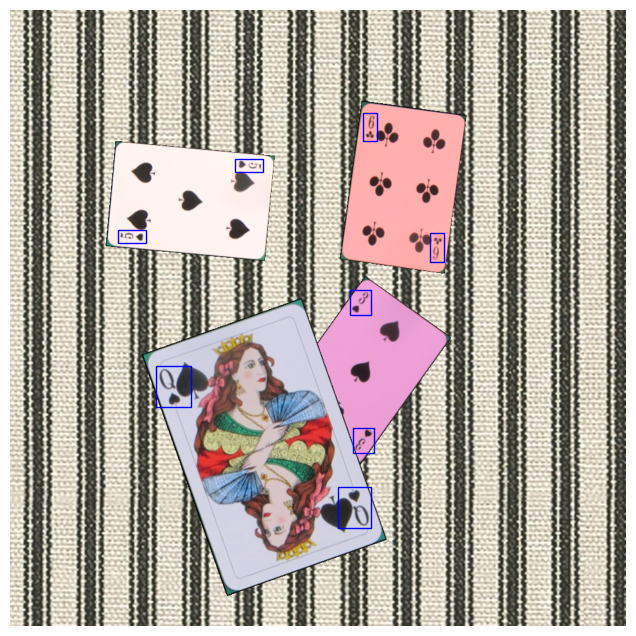

In [128]:
bg=backgrounds.get_random()
img1,card_val1,hulla1,hullb1=cards_photos.get_random()
img2,card_val2,hulla2,hullb2=cards_photos.get_random()
img3,card_val3,hulla3,hullb3=cards_photos.get_random()
img4,card_val4,hulla4,hullb4=cards_photos.get_random()

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3,img4,card_val4,hulla4,hullb4, transform_form='full')
newimg.display()
plt.axis('off')

Test sceny z sześcioma kartami

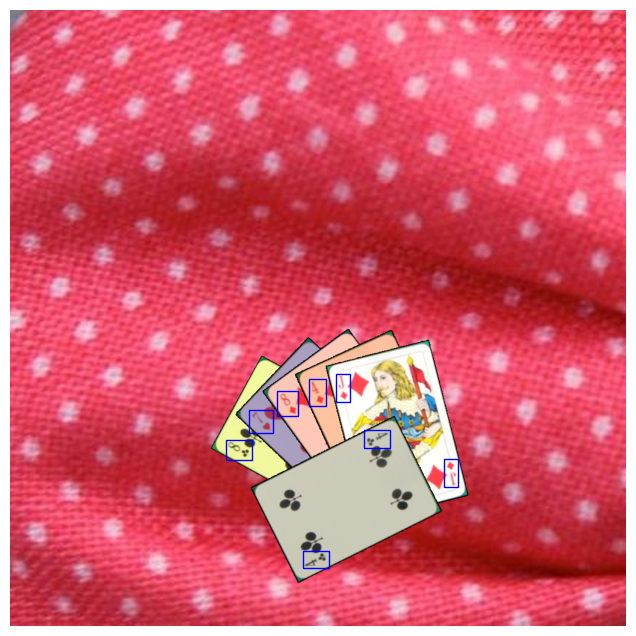

In [129]:
bg=backgrounds.get_random()
img1,card_val1,hulla1,hullb1=cards_photos.get_random()
img2,card_val2,hulla2,hullb2=cards_photos.get_random()
img3,card_val3,hulla3,hullb3=cards_photos.get_random()
img4,card_val4,hulla4,hullb4=cards_photos.get_random()
img5,card_val5,hulla5,hullb5=cards_photos.get_random()
img6,card_val6,hulla6,hullb6=cards_photos.get_random()

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3,img4,card_val4,hulla4,hullb4,img5,card_val5,hulla5,hullb5,img6,card_val6,hulla6,hullb6, transform_form='full')
newimg.display()
plt.axis('off')

### cards_videos

Przeprowadźmy test generowania scen dla kart pochodzących z plików wideo. Karty te nie zostaną poddane żadnym zmianą jasności, kontrastu lub rozmycia.

Test sceny z dwoma kartami

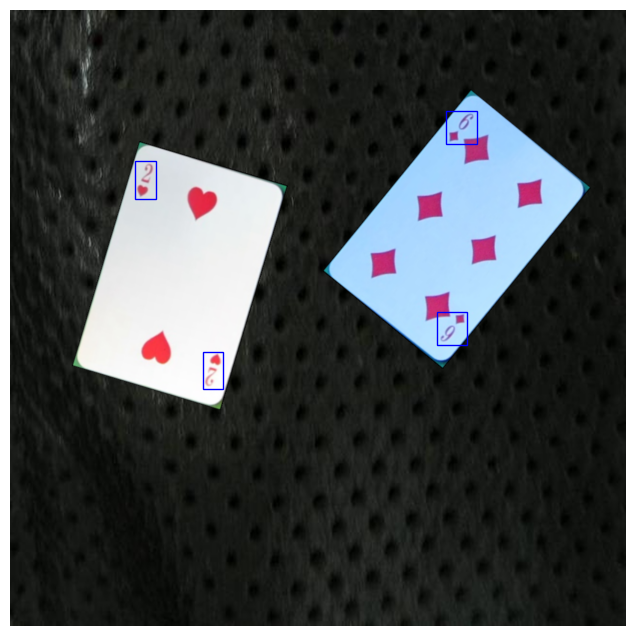

In [130]:
bg=backgrounds.get_random()
img1,card_val1,hulla1,hullb1=cards_videos.get_random()
img2,card_val2,hulla2,hullb2=cards_videos.get_random()

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2, transform_form='no')
newimg.display()
plt.axis('off')

Test sceny z trzema kartami

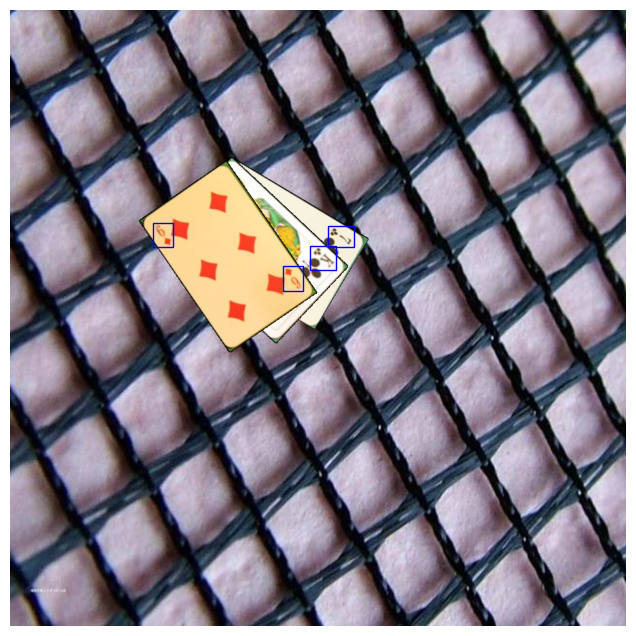

In [131]:
bg=backgrounds.get_random()
img1,card_val1,hulla1,hullb1=cards_videos.get_random()
img2,card_val2,hulla2,hullb2=cards_videos.get_random()
img3,card_val3,hulla3,hullb3=cards_videos.get_random()

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3, transform_form='no')
newimg.display()
plt.axis('off')

Test sceny z czterema kartami

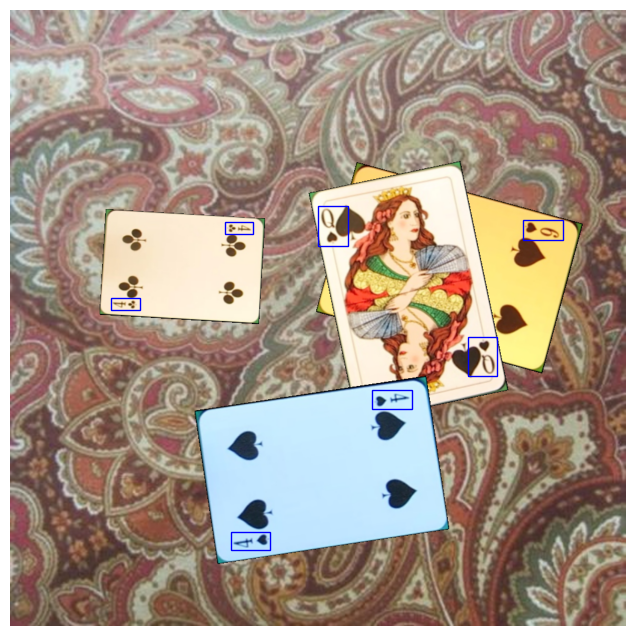

In [132]:
bg=backgrounds.get_random()
img1,card_val1,hulla1,hullb1=cards_videos.get_random()
img2,card_val2,hulla2,hullb2=cards_videos.get_random()
img3,card_val3,hulla3,hullb3=cards_videos.get_random()
img4,card_val4,hulla4,hullb4=cards_videos.get_random()

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3,img4,card_val4,hulla4,hullb4, transform_form='no')
newimg.display()
plt.axis('off')

Test sceny z sześcioma kartami

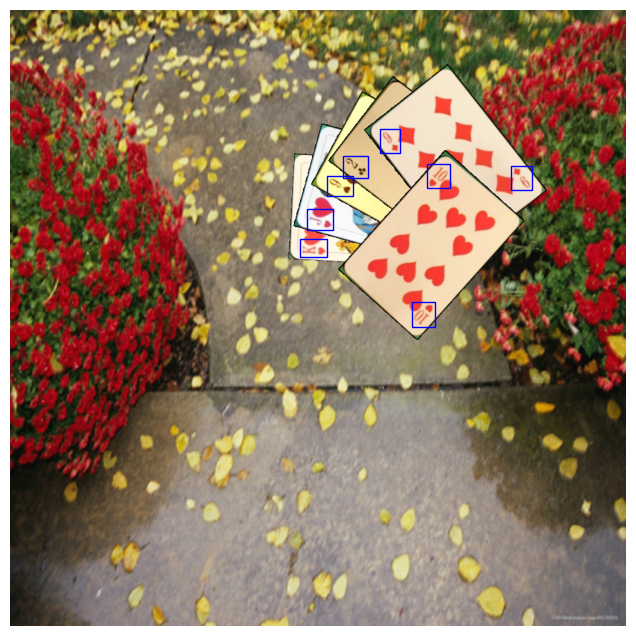

In [133]:
bg=backgrounds.get_random()
img1,card_val1,hulla1,hullb1=cards_videos.get_random()
img2,card_val2,hulla2,hullb2=cards_videos.get_random()
img3,card_val3,hulla3,hullb3=cards_videos.get_random()
img4,card_val4,hulla4,hullb4=cards_videos.get_random()
img5,card_val5,hulla5,hullb5=cards_videos.get_random()
img6,card_val6,hulla6,hullb6=cards_videos.get_random()

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3,img4,card_val4,hulla4,hullb4,img5,card_val5,hulla5,hullb5,img6,card_val6,hulla6,hullb6, transform_form='no')
newimg.display()
plt.axis('off')

# Generowanie gotowych scen

Finalnie zostało nam już tylko wygenerowanie finalnych scen w zależności od pochodzenia kart (czy ze zdjęć, czy z wideo)

Funkcja wymnażająca każdy element listy przez pewną liczbę *num*.

In [134]:
def multiply_list(lst, num):
    return [int((i * num)//1) for i in lst]

'generate_scenes' odpowiada za generowanie wszystkich scen dla danej klasy kart. Możemy wybrać ilość generowanych kart oraz to jakiej transformacji mają podlegać, zarówno jak folder w którym zapsizemy nasze sceny.

Działanie:
1. Utworzenie folderu docelowego, jeżeli nie istnieje
2. Przypisanie podanej (lub domyślnej) klasy 'Cards'
3. Dla każdego przeznaczenia danych (treningowe, walidacyjne, testowe):
    1. Generowanie scen dla dwóch kart oraz ich zapisanie
    2. Generowanie scen dla trzech kart oraz ich zapisanie
    3. Generowanie scen dla czterech kart oraz ich zapisanie
    4. Generowanie scen dla sześciu kart oraz ich zapisanie

In [135]:
def generate_scenes(save_dir = "data/scenes/photos", gen_distribution = 25, val_percent = 0.1, test_percent = 0.1, cards_cl = cards_photos, transform = 'no'):
    if not os.path.isdir(save_dir):
        os.makedirs(save_dir)

    num_of_generators = 4
    cards_class = cards_cl
    

    if isinstance(gen_distribution, int):
        gen_distribution = [gen_distribution for i in range(num_of_generators)]
    elif isinstance(gen_distribution, (list, tuple)):
        if len(gen_distribution) < num_of_generators:
            for i in range(num_of_generators - len(gen_distribution)):
                gen_distribution.append(gen_distribution[-1])
        else:
            gen_distribution = gen_distribution[:num_of_generators]
    else:
        raise TypeError("Zły typ 'gen_distribution'. Powinien być 'int', 'list' lub 'tuple'.")

    if (1 - val_percent - test_percent) < 0:
        raise ValueError("'val_percent' i 'test_percent' większe od 1.")


    # gen
    print(f"Generowanie dla transformacji: '{transform}'\n")

    for data_destination in ['train', 'val', 'test']:

        if data_destination == 'test':
            if test_percent > 0.0:
                nb_cards_to_generate = multiply_list(gen_distribution, test_percent)
                data_dest_print = ' (test)'
            else:
                continue

        elif data_destination == 'val':
            if val_percent > 0.0:
                nb_cards_to_generate = multiply_list(gen_distribution, val_percent)
                data_dest_print = '  (val)'
            else:
                continue

        elif data_destination == 'train':
            nb_cards_to_generate = multiply_list(gen_distribution, (1 - val_percent - test_percent))
            data_dest_print = '(train)'

        
        dest_dir = os.path.join(save_dir, data_destination, 'images')
        if not os.path.isdir(dest_dir):
            os.makedirs(dest_dir)


        print(f'\tGenerowanie zbioru: {data_destination}')

        # 2
        for i in tqdm(range(nb_cards_to_generate.pop(0)), desc=f'{data_dest_print} Generowanie scen dla dwóch kart   \t'):
            bg=backgrounds.get_random()
            img1,card_val1,hulla1,hullb1=cards_class.get_random()
            img2,card_val2,hulla2,hullb2=cards_class.get_random()
            
            newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2, transform_form=transform)
            newimg.write_files(dest_dir)

        # 3
        for i in tqdm(range(nb_cards_to_generate.pop(0)), desc=f'{data_dest_print} Generowanie scen dla trzech kart  \t'):
            bg=backgrounds.get_random()
            img1,card_val1,hulla1,hullb1=cards_class.get_random()
            img2,card_val2,hulla2,hullb2=cards_class.get_random()
            img3,card_val3,hulla3,hullb3=cards_class.get_random()
            
            newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3, transform_form=transform)
            newimg.write_files(dest_dir)

        # 4
        for i in tqdm(range(nb_cards_to_generate.pop(0)), desc=f'{data_dest_print} Generowanie scen dla czterech kart\t'):
            bg=backgrounds.get_random()
            img1,card_val1,hulla1,hullb1=cards_class.get_random()
            img2,card_val2,hulla2,hullb2=cards_class.get_random()
            img3,card_val3,hulla3,hullb3=cards_class.get_random()
            img4,card_val4,hulla4,hullb4=cards_class.get_random()

            newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3,img4,card_val4,hulla4,hullb4, transform_form=transform)
            newimg.write_files(dest_dir)

        # 6
        for i in tqdm(range(nb_cards_to_generate.pop(0)), desc=f'{data_dest_print} Generowanie scen dla sześciu kart \t'):
            bg=backgrounds.get_random()
            img1,card_val1,hulla1,hullb1=cards_class.get_random()
            img2,card_val2,hulla2,hullb2=cards_class.get_random()
            img3,card_val3,hulla3,hullb3=cards_class.get_random()
            img4,card_val4,hulla4,hullb4=cards_class.get_random()
            img5,card_val5,hulla5,hullb5=cards_class.get_random()
            img6,card_val6,hulla6,hullb6=cards_class.get_random()

            newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3,img4,card_val4,
                         hulla4,hullb4,img5,card_val5,hulla5,hullb5,img6,card_val6,hulla6,hullb6, transform_form=transform)
            newimg.write_files(dest_dir)

        print('')

Usuńmy stare sceny.

In [136]:
# Delete existing scenes
if os.path.exists("data/scenes/"):
    shutil.rmtree("data/scenes/")

Generowanie dla kart pochodzących ze zdjęć.

In [137]:
save_dir = "data/scenes/photos"
nb_cards_to_generate = multiply_list([30, 30, 20, 20], 1) # lista razem ma 100
val_percent = 0.15
test_percent = 0.15
cards_cl = cards_photos
transform = 'full'

generate_scenes(save_dir, nb_cards_to_generate, val_percent, test_percent, cards_cl, transform)

Generowanie dla transformacji: 'full'

	Generowanie zbioru: train


(train) Generowanie scen dla sześciu kart 	: 100%|██████████| 14/14 [00:11<00:00,  1.26it/s]



	Generowanie zbioru: val


  (val) Generowanie scen dla sześciu kart 	: 100%|██████████| 3/3 [00:03<00:00,  1.07s/it]



	Generowanie zbioru: test


 (test) Generowanie scen dla sześciu kart 	: 100%|██████████| 3/3 [00:02<00:00,  1.43it/s]

Generowanie dla kart pochodzących z wideo.

In [138]:
save_dir = "data/scenes/videos"
nb_cards_to_generate = multiply_list([30, 30, 20, 20], 1) # lista razem ma 100
val_percent = 0.15
test_percent = 0.15
cards_cl = cards_videos
transform = 'no'

generate_scenes(save_dir, nb_cards_to_generate, val_percent, test_percent, cards_cl, transform)

Generowanie dla transformacji: 'no'

	Generowanie zbioru: train


(train) Generowanie scen dla sześciu kart 	: 100%|██████████| 14/14 [00:09<00:00,  1.55it/s]



	Generowanie zbioru: val


  (val) Generowanie scen dla sześciu kart 	: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]



	Generowanie zbioru: test


 (test) Generowanie scen dla sześciu kart 	: 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

## Konwertowanie danych do YOLO

Po wygenerowaniu naszych scen chcemy dla każdej z osobna utworzyć plik tekstowy zawierający informację o każdej widocznej powłoce.

Pliki te będą zawierać następująco:
1. Klasę do jakiej należy dana karta (w postaci indeksu)

2. położenie na osi x środka ramki (w procentach względem szerokości sceny)

3. położenie na osi y środka ramki (w procentach względem wysokości sceny)

4. szerokość ramki (w procentach względem szerokości sceny)

5. wysokość ramki (w procentach wysokości sceny)

Dla każdej znalezionej powłoki tworzymy nową linię w pliku.

Utwórzmy plik *'data/scenes/cards.names'* zawierający wszystkie nazwy kart (52 kombinacje - tyle ile jest kart). Korzystając z tego pliku będziemy otrzymywać indeksy danych kart.

In [139]:
with open('data/scenes/cards.names', 'w') as file:
    for suit in card_suits:
        for value in card_values:
            card_name = value + suit
            file.write(card_name + '\n')

Funkcja 'convert' odpowiada za przekonwertowanie położenia odpowiednich współrzędnych, wyrażonych w pikselach, na wartości procentowe.

In [140]:
def convert(size, box):
    dw = 1./size[0]
    dh = 1./size[1]
    x = (box[0] + box[1])/2.0
    y = (box[2] + box[3])/2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    x = x*dw
    w = w*dw
    y = y*dh
    h = h*dh
    return (x,y,w,h)

'convert_annotation' służy do przekonwertowania pojedyńczej sceny do formatu używanego w YOLO.

Działanie:
1. Otwieramy plik z rozszerzeniem .xml

2. Tworzymy plik .txt o tej samej nazwie co .xml

3. Przypisujemy odpowiednie wartości, takie jak szerokość czy wysokość

4. Dla każdego obiektu (ramki na karcie) w pliku .xml:
    1. Znajdujemy nazwę klasy (karty) oraz informację czy ramka jest zakryta
    2. Jeżeli nie ma na liście podanej klasy lub ramka jest zakryta to przechodzimy do następnego obiektu
    3. Znajdujemy indeks danej klasy oraz położenie ramki
    4. Korzystamy z funkcji 'convert', aby otrzymać odpowiednie dane
    5. Zapisujemy w pliku .txt nasze przekonwertowane informację o ramce

5. Kończymy pracę na plikach

6. Przenosimy plik. txt do odpowiedniego folderu oraz usuwamy plik .xml

In [141]:
def convert_annotation(xml_fn, classes, labels_dir):
    in_file = open(xml_fn)
    txt_fn=xml_fn.replace(".xml",".txt")
    out_file = open(txt_fn, 'w')
    tree=ET.parse(in_file)
    root = tree.getroot()
    size = root.find('size')
    w = int(size.find('width').text)
    h = int(size.find('height').text)

    for obj in root.iter('object'):
        difficult = obj.find('difficult').text
        cls = obj.find('name').text
        if cls not in classes or int(difficult) == 1:
            continue
        cls_id = classes.index(cls)
        xmlbox = obj.find('bndbox')
        b = (float(xmlbox.find('xmin').text), float(xmlbox.find('xmax').text), float(xmlbox.find('ymin').text), float(xmlbox.find('ymax').text))
        bb = convert((w,h), b)
        out_file.write(f"{cls_id} {bb[0]:0.6f} {bb[1]:0.6f} {bb[2]:0.6f} {bb[3]:0.6f}\n")
    in_file.close()
    out_file.close()

    shutil.move(txt_fn, labels_dir)
    os.remove(xml_fn)

Funkcja 'convert_vol_yolo' służy do przekonwertowania wszystkich scen w folderze do formatu kompatybilnego z YOLO.

In [142]:
def convert_vol_yolo(images_dir, classes_fn):
    if not os.path.isfile(classes_fn):
        print(f"Classes file {classes_fn} is not a file")
        return None
    if not os.path.isdir(images_dir):
        print(f"{images_dir} is not a directory")
        return None
    
    with open(classes_fn,"r") as f:
        classes=f.read().split("\n")
    classes=[c for c in classes if c!='']

    for data_type in ['train', 'val', 'test']:
        if not os.path.exists(os.path.join(images_dir, data_type)):
            continue

        labels_dir = os.path.join(images_dir, data_type, 'labels')
        if not os.path.isdir(labels_dir):
            os.makedirs(labels_dir)
            
        for i,xml_fn in enumerate(glob(os.path.join(images_dir, data_type, 'images')+"/*.xml")):
            img_fn=xml_fn.replace(".xml",".jpg")
            convert_annotation(xml_fn, classes, labels_dir)

        print(f"Przekonwertowano: {i+1} scen dla '{data_type}'.")

#### Konwersja wygenerowanych scen

Sceny 'photos'

In [143]:
images_dir = "data/scenes/photos"
classes_fn = "data/scenes/cards.names"

print("  Konwertowanie dla kart 'photos':\n")
convert_vol_yolo(images_dir, classes_fn)

  Konwertowanie dla kart 'photos':

Przekonwertowano: 70 scen dla 'train'.
Przekonwertowano: 14 scen dla 'val'.
Przekonwertowano: 14 scen dla 'test'.


Sceny 'videos'

In [144]:
images_dir = "data/scenes/videos"
classes_fn = "data/scenes/cards.names"

print("  Konwertowanie dla kart 'videos':\n")
convert_vol_yolo(images_dir, classes_fn)

  Konwertowanie dla kart 'videos':

Przekonwertowano: 70 scen dla 'train'.
Przekonwertowano: 14 scen dla 'val'.
Przekonwertowano: 14 scen dla 'test'.


Po ukończeniu konwersji możemy przejść do uczenia sieci.